In [1]:
!pip install imagehash
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 9.9 MB/s eta 0:00:00


In [2]:
# Basic Modules
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random
# For Identifying Duplicates
import imagehash
# For Visualization and Feature Reduction
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# For Feature Extraction
from scipy.fft import fft2, fftshift
from skimage.feature import hog
from skimage import exposure
# For Feature Selection
from sklearn.feature_selection import f_classif, SelectKBest
# For Clustering
import skfuzzy as fuzz
# Mutual Information Values
from sklearn.metrics import adjusted_mutual_info_score, normalized_mutual_info_score

All Functions

In [3]:
def find_duplicate_images(dataset_path, categories):
    hash_dict = {}
    duplicates = []
    for category in categories:
        folder_path = os.path.join(dataset_path, category)
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.jpg') or file_name.endswith('.png') or file_name.endswith('.jpeg'):
                image_path = os.path.join(folder_path, file_name)
                # Load the image and compute its hash
                image = Image.open(image_path)
                image_hash = imagehash.average_hash(image)
                # Check if the hash is already in the dictionary
                if image_hash in hash_dict:
                    duplicates.append((image_path, hash_dict[image_hash]))  # Store the duplicate image path
                else:
                    hash_dict[image_hash] = image_path  # Store the image path by its hash
    return duplicates

def compute_fft_magnitude(image, flatten=False, plot_img=False, plot_fft=False):
    # Apply Fourier Transform
    f_transform = fft2(image)
    # Shift zero-frequency component to center
    f_transform_shifted = fftshift(f_transform)
    # Magnitude Spectrum + add small epsilon value to avoid log(0) issue
    epsilon = 1e-10
    magnitude_spectrum = np.log10(np.abs(f_transform_shifted) + epsilon)
    if plot_img == True:
        # Visualize image
        plt.imshow(image)
        plt.title('Original Image')
        plt.show()
    if plot_fft == True:
        # Normalize magnitude to range [0, 1] (else floats can't be imshow plotted)
        magnitude_spectrum_normalized = (magnitude_spectrum - np.min(magnitude_spectrum)) / (np.max(magnitude_spectrum) - np.min(magnitude_spectrum))
        # Visualize magnitude spectrum
        plt.imshow(magnitude_spectrum_normalized, cmap='gray')
        plt.title('Fourier Magnitude Spectrum')
        plt.show()
    if flatten == True:
        # Flatten the magnitude spectrum
        X_fourier = magnitude_spectrum.flatten()
    else:
        X_fourier = magnitude_spectrum
    return X_fourier

# low-pass filter for FFT to reduce feature space
def reduce_fft_features(magnitude_spectrum, crop_size, plot_fft=False, flatten=False):
    # Get the center portion of the magnitude spectrum
    center_x, center_y = magnitude_spectrum.shape[0] // 2, magnitude_spectrum.shape[1] // 2
    half_crop = crop_size // 2
    cropped_magnitude = magnitude_spectrum[center_x - half_crop : center_x + half_crop,
                                           center_y - half_crop : center_y + half_crop]
    if plot_fft == True:
        # Visualize magnitude spectrum
        cropped_magnitude_normalized = (cropped_magnitude - np.min(cropped_magnitude)) / (np.max(cropped_magnitude) - np.min(cropped_magnitude))
        plt.imshow(cropped_magnitude_normalized, cmap='gray')
        plt.title(f"Reduced Feature - FFT - crop size = {crop_size}")
        plt.show()
    if flatten==True:
        cropped_magnitude =  cropped_magnitude.flatten()
    return cropped_magnitude

# Flattening for all images
def flatten_image_set(images):
    flattened_images = []
    for image in images:
        flattened_images.append(image.flatten())
    return np.array(flattened_images)

# Compute Fourier Transform magnitude for all images with low-pass filtering option
def fft_image_set(images, crop_size=None):
    fft_features = []
    for image in images:
        if crop_size == None:
            fft_feature = compute_fft_magnitude(image, flatten=True)
        else:
            fft_feature = compute_fft_magnitude(image)
            fft_feature = reduce_fft_features(fft_feature, crop_size, flatten=True)
        fft_features.append(fft_feature)
    return np.array(fft_features)

# HOG Features Extraction for entire Image Dataset
def apply_hog(images):
    hog_features = []
    hog_images = []
    for image in images:
        # Compute HOG features
        features, hog_image = hog(image, pixels_per_cell=(16, 16),
                                  cells_per_block=(2, 2), visualize=True,
                                  block_norm='L2', channel_axis=2)
        # Normalize HOG image for better visualization
        hog_image = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        # Add features and images to corresponding lists
        hog_features.append(features)
        hog_images.append(hog_image)
    return np.array(hog_features), hog_images

def plot_image(index, images, labels, categories):
    # Get the image and label
    image = images[index]
    label = labels[index]
    # Create the plot
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis('off')  # Hide the axes
    plt.title(f"Category: {categories[label]}")
    plt.show()

def plot_duplicate_images(duplicates, image_paths, labels, categories):
    for i, dup in enumerate(duplicates):
        dup1_path, dup2_path = dup
        # Get the indices of the duplicate images in the image_paths list
        dup1_index = image_paths.index(dup1_path)
        dup2_index = image_paths.index(dup2_path)
        # Load the images
        image1 = images[dup1_index]
        image2 = images[dup2_index]
        # Get the labels (categories)
        label1 = labels[dup1_index]
        label2 = labels[dup2_index]
        # Print the image paths
        print("Pair ",i+1,":")
        print(f"Duplicate 1 Path: {dup1_path}")
        print(f"Duplicate 2 Path: {dup2_path}")
        # Create a subplot with 2 images
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns
        # Display first image
        axes[0].imshow(image1)
        axes[0].axis('off')  # Hide the axes
        axes[0].set_title(f"Category: {categories[label1]}")
        # Display second image
        axes[1].imshow(image2)
        axes[1].axis('off')  # Hide the axes
        axes[1].set_title(f"Category: {categories[label2]}")
        # Display the plot
        plt.show()

# Function to plot 2D features
def plot_2d_projection(features_2d, labels, categories, method_name):
    plt.figure()
    for i, category in enumerate(categories):
        indices = np.where(labels == i)
        plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=category, alpha=0.65)
    plt.legend(loc='best')
    plt.title(f"2D Projection with {method_name}")
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.show()

# Function to plot 3D features
def plot_3d_projection(features_3d, labels, categories, method_name):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for i, category in enumerate(categories):
        indices = np.where(labels == i)  # Changed from labels_cleaned to labels
        ax.scatter(features_3d[indices, 0], features_3d[indices, 1], features_3d[indices, 2], label=category, alpha=0.65)
    ax.legend(loc='best')
    ax.set_title(f"3D Projection with {method_name}")
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")
    ax.set_zlabel("Component 3")
    plt.show()


# Function to run Fuzzy C Means and return relevant metrics
def perform_fuzzy_cmeans(X, n_clusters):
    cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
        X.T, n_clusters, m=2, error=0.005, maxiter=1000, init=None)
    cluster_membership = np.argmax(u, axis=0)
    return {'fpc': fpc, 'jm': jm, 'p': p, 'cluster_centers': cntr,
            'cluster_membership': cluster_membership}


# Function to evaluate different pipelines (FFT, HoG, Flattened) and store FPC
def evaluate_fcm_pipelines(hog_features, images, labels, n_cluster_grid, feature_grid, crop_size_grid):
    results = []
    # flatten images
    flattened_images = flatten_image_set(images)
    # FFT Pipeline (with cropping)
    for n_clusters in n_cluster_grid:
        for crop_size in crop_size_grid:
            print(f"Evaluating FFT pipeline: {n_clusters} clusters, crop size {crop_size}")
            # Apply cropping to FFT features
            fft_features = fft_image_set(images, crop_size=crop_size)
            # Perform Fuzzy C Means clustering
            fcm_result = perform_fuzzy_cmeans(fft_features, n_clusters)
            # Store relevant metrics for FFT pipeline
            results.append({
                'pipeline': 'FFT',
                'n_clusters': n_clusters,
                'crop_size': crop_size,
                'fpc': fcm_result['fpc'],
                'jm': fcm_result['jm'],
                'iterations': fcm_result['p']
            })
    # HoG Pipeline (with feature selection)
    for n_clusters in n_cluster_grid:
        for feature_count in feature_grid:
            print(f"Evaluating HoG pipeline: {n_clusters} clusters, {feature_count} features")
            # Apply feature selection (ANOVA) if feature count is less than the total features
            if feature_count < hog_features.shape[1]:
                selector = SelectKBest(f_classif, k=feature_count)
                selected_hog_features = selector.fit_transform(hog_features, labels)
            else:
                selected_hog_features = hog_features  # No feature selection if feature_count = total features
            # Perform Fuzzy C Means clustering
            fcm_result = perform_fuzzy_cmeans(selected_hog_features, n_clusters)
            # Store relevant metrics for HoG pipeline
            results.append({
                'pipeline': 'HoG',
                'n_clusters': n_clusters,
                'feature_count': feature_count,
                'fpc': fcm_result['fpc'],
                'jm': fcm_result['jm'],
                'iterations': fcm_result['p']
            })
    # Flattened Image Pipeline (with feature selection)
    for n_clusters in n_cluster_grid:
        for feature_count in feature_grid:
            print(f"Evaluating Flattened Image pipeline: {n_clusters} clusters, {feature_count} features")
            # Apply feature selection (ANOVA) if feature count is less than the total features
            if feature_count < flattened_images.shape[1]:
                selector = SelectKBest(f_classif, k=feature_count)
                selected_flattened_images = selector.fit_transform(flattened_images, labels)
            else:
                selected_flattened_images = flattened_images  # No feature selection if feature_count = total features
            # Perform Fuzzy C Means clustering
            fcm_result = perform_fuzzy_cmeans(selected_flattened_images, n_clusters)
            # Store relevant metrics for Flattened Image pipeline
            results.append({
                'pipeline': 'Flattened',
                'n_clusters': n_clusters,
                'feature_count': feature_count,
                'fpc': fcm_result['fpc'],
                'jm': fcm_result['jm'],
                'iterations': fcm_result['p']
            })
    return results

# Function to visualize FPC for different pre-processing pipelines
def plot_fpc_results(results):
    # Separate results by pipeline type
    fft_results = [r for r in results if r['pipeline'] == 'FFT']
    hog_results = [r for r in results if r['pipeline'] == 'HoG']
    flattened_results = [r for r in results if r['pipeline'] == 'Flattened']
    # Plot FFT Results
    plt.figure(figsize=(10, 6))
    fft_fpcs = [r['fpc'] for r in fft_results]
    fft_cluster_sizes = [r['n_clusters'] for r in fft_results]
    fft_crop_sizes = [r['crop_size'] for r in fft_results]
    plt.scatter(fft_cluster_sizes, fft_crop_sizes, c=fft_fpcs, cmap='viridis', s=100)
    plt.colorbar(label='Fuzzy Partition Coefficient (FPC)')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Crop Size (FFT)')
    plt.title('FPC for FFT Pipeline')
    plt.grid(True)
    plt.show()
    # Plot HoG Results
    plt.figure(figsize=(10, 6))
    hog_fpcs = [r['fpc'] for r in hog_results]
    hog_cluster_sizes = [r['n_clusters'] for r in hog_results]
    hog_feature_counts = [r['feature_count'] for r in hog_results]
    plt.scatter(hog_cluster_sizes, hog_feature_counts, c=hog_fpcs, cmap='plasma', s=100)
    plt.colorbar(label='Fuzzy Partition Coefficient (FPC)')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Number of Features (HoG)')
    plt.title('FPC for HoG Pipeline')
    plt.grid(True)
    plt.show()
    # Plot Flattened Image Results
    plt.figure(figsize=(10, 6))
    flattened_fpcs = [r['fpc'] for r in flattened_results]
    flattened_cluster_sizes = [r['n_clusters'] for r in flattened_results]
    flattened_feature_counts = [r['feature_count'] for r in flattened_results]
    # Complete plot
    plt.scatter(flattened_cluster_sizes, flattened_feature_counts, c=flattened_fpcs, cmap='coolwarm', s=100)
    plt.colorbar(label='Fuzzy Partition Coefficient (FPC)')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Number of Features (Flattened Images)')
    plt.title('FPC for Flattened Image Pipeline')
    plt.grid(True)
    plt.show()


# Function to plot FPC vs. number of features or crop size with a curve family for each cluster size (k)
def plot_fpc_vs_features_or_crop(results):
    # Separate results by pipeline type
    fft_results = [r for r in results if r['pipeline'] == 'FFT']
    hog_results = [r for r in results if r['pipeline'] == 'HoG']
    flattened_results = [r for r in results if r['pipeline'] == 'Flattened']
    # Function to plot a family of curves for a specific pipeline
    def plot_family_curve(pipeline_results, x_param, pipeline_name):
        # Get all unique cluster sizes (k) from the results
        cluster_sizes = sorted(set(r['n_clusters'] for r in pipeline_results))
        # Create a figure
        plt.figure(figsize=(10, 6))
        # Plot a curve for each cluster size
        for k in cluster_sizes:
            # Filter results for this specific cluster size
            results_k = [r for r in pipeline_results if r['n_clusters'] == k]
            # Remove any None values from x_param and corresponding fpc values
            x_values = [r[x_param] for r in results_k if r[x_param] is not None]
            fpc_values = [r['fpc'] for r in results_k if r[x_param] is not None]
            # Sort by x-values for smoother curves
            if len(x_values) > 0:
                sorted_indices = np.argsort(x_values)
                x_values = np.array(x_values)[sorted_indices]
                fpc_values = np.array(fpc_values)[sorted_indices]
                # Plot the FPC curve
                plt.plot(x_values, fpc_values, marker='o', label=f'FPC (k = {k})')
                # Add the 1/k curve
                k_curve_y = [1 / k] * len(x_values)  # Constant line at y = 1/k
                plt.plot(x_values, k_curve_y, linestyle='--', color=plt.gca().lines[-1].get_color(),
                         label=f'1/k (k = {k})')
        # Add labels, title, and legend
        plt.xlabel(f"{x_param.capitalize()} (Number of Features for HoG/Flattened or Crop Size for FFT)")
        plt.ylabel('Fuzzy Partition Coefficient (FPC)')
        plt.title(f'FPC vs {x_param.capitalize()} for {pipeline_name} Pipeline')
        plt.legend(title="Number of Clusters (k)", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
        plt.tight_layout()  # Improve layout
        plt.show()
    # Plot for FFT pipeline (crop size on x-axis)
    if len(fft_results) > 0:
        plot_family_curve(fft_results, 'crop_size', 'FFT')
    # Plot for HoG pipeline (number of features on x-axis)
    if len(hog_results) > 0:
        plot_family_curve(hog_results, 'feature_count', 'HoG')
    # Plot for Flattened Image pipeline (number of features on x-axis)
    if len(flattened_results) > 0:
        plot_family_curve(flattened_results, 'feature_count', 'Flattened Images')

def calculate_fpc_increase(results):
    # Create a dictionary to store the percentage increase results
    percentage_increase_results = []
    # Loop through each result and calculate the percentage increase
    for result in results:
        k = result['n_clusters']
        fpc = result['fpc']
        # Worst possible FPC is 1/k
        worst_fpc = 1 / k
        # Calculate the percentage increase
        if fpc > worst_fpc:
            increase = ((fpc - worst_fpc) / worst_fpc) * 100
        else:
            increase = 0  # If FPC is worse or equal to 1/k, consider it 0% increase
        # Append to the list of results
        percentage_increase_results.append({
            'n_clusters': k,
            'pipeline': result['pipeline'],
            'crop_size': result.get('crop_size', None),
            'feature_count': result.get('feature_count', None),
            'fpc': fpc,
            'percentage_increase': increase
        })
    return percentage_increase_results


def find_best_configuration(results):
    # Calculate percentage increase for all results
    percentage_increase_results = calculate_fpc_increase(results)
    # Sort the results by FPC to find the best raw FPC
    best_fpc_result = max(percentage_increase_results, key=lambda x: x['fpc'])
    # Sort the results by percentage increase to find the highest improvement over 1/k
    best_increase_result = max(percentage_increase_results, key=lambda x: x['percentage_increase'])
    print("Best Configuration Based on FPC:")
    print(f"Pipeline: {best_fpc_result['pipeline']}")
    if best_fpc_result['pipeline'] == 'FFT':
        print(f"Crop Size: {best_fpc_result['crop_size']}")
    else:
        print(f"Feature Count: {best_fpc_result['feature_count']}")
    print(f"Number of Clusters (k): {best_fpc_result['n_clusters']}")
    print(f"FPC: {best_fpc_result['fpc']:.4f}")
    print(f"Percentage Increase: {best_fpc_result['percentage_increase']:.2f}%\n")
    print("Best Configuration Based on Percentage Increase:")
    print(f"Pipeline: {best_increase_result['pipeline']}")
    if best_increase_result['pipeline'] == 'FFT':
        print(f"Crop Size: {best_increase_result['crop_size']}")
    else:
        print(f"Feature Count: {best_increase_result['feature_count']}")
    print(f"Number of Clusters (k): {best_increase_result['n_clusters']}")
    print(f"FPC: {best_increase_result['fpc']:.4f}")
    print(f"Percentage Increase: {best_increase_result['percentage_increase']:.2f}%")
    return best_fpc_result, best_increase_result


def plot_random_image_with_cluster(images, fft_features, cntr, u, cluster_membership):
    # Pick a random image index
    random_index = random.randint(0, len(images) - 1)
    # Get the random image and its assigned cluster
    random_image = images[random_index]
    assigned_cluster = cluster_membership[random_index]
    # Plot the image
    plt.imshow(random_image, cmap='gray')
    plt.title(f"Assigned Cluster: {assigned_cluster}")
    plt.show()


def find_best_configuration_for_k(results, chosen_k):
    # Filter results based on the chosen number of clusters (n_clusters)
    filtered_results = [result for result in results if result['n_clusters'] == chosen_k]
    if not filtered_results:
        print(f"No results found for k = {chosen_k}")
        return None, None
    # Calculate percentage increase for all filtered results
    percentage_increase_results = calculate_fpc_increase(filtered_results)
    # Sort the results by FPC to find the best raw FPC
    best_fpc_result = max(percentage_increase_results, key=lambda x: x['fpc'])
    # Sort the results by percentage increase to find the highest improvement over 1/k
    best_increase_result = max(percentage_increase_results, key=lambda x: x['percentage_increase'])
    # Print the best configuration based on FPC
    print(f"Best Configuration for k={chosen_k} Based on FPC:")
    print(f"Pipeline: {best_fpc_result['pipeline']}")
    if best_fpc_result['pipeline'] == 'FFT':
        print(f"Crop Size: {best_fpc_result['crop_size']}")
    else:
        print(f"Feature Count: {best_fpc_result.get('feature_count', 'N/A')}")
    print(f"FPC: {best_fpc_result['fpc']:.4f}")
    print(f"Percentage Increase: {best_fpc_result['percentage_increase']:.2f}%\n")

    # Print the best configuration based on percentage increase
    print(f"Best Configuration for k={chosen_k} Based on Percentage Increase:")
    print(f"Pipeline: {best_increase_result['pipeline']}")
    if best_increase_result['pipeline'] == 'FFT':
        print(f"Crop Size: {best_increase_result['crop_size']}")
    else:
        print(f"Feature Count: {best_increase_result.get('feature_count', 'N/A')}")
    print(f"FPC: {best_increase_result['fpc']:.4f}")
    print(f"Percentage Increase: {best_increase_result['percentage_increase']:.2f}%")
    return best_fpc_result, best_increase_result


def count_images_per_cluster(cluster_membership, n_clusters):
    # Create an empty list to store the count of images in each cluster
    cluster_counts = [0] * n_clusters
    # Count how many images are assigned to each cluster
    for cluster in cluster_membership:
        cluster_counts[cluster] += 1
    # Print the number of images in each cluster
    for i, count in enumerate(cluster_counts):
        print(f"Cluster {i}: {count} images")
    return cluster_counts

def create_contingency_matrix(true_labels, pred_labels, num_classes):
    # Initialize a matrix of zeros
    contingency = np.zeros((num_classes, num_classes), dtype=int)
    # Populate the contingency matrix
    for t, p in zip(true_labels, pred_labels):
        contingency[t, p] += 1
    return contingency


def assign_classes_to_clusters(cluster_membership, labels, n_clusters, num_classes):
    # Create a contingency matrix
    contingency = create_contingency_matrix(labels, cluster_membership, num_classes)
    # Find the class with the most occurrences for each cluster
    cluster_to_class_mapping = {}
    for cluster in range(n_clusters):
        # Find the index (class) with the maximum count in the contingency table for this cluster
        class_index = np.argmax(contingency[:, cluster])
        cluster_to_class_mapping[cluster] = class_index
    return cluster_to_class_mapping, contingency




# Function to evaluate different pipelines (FFT, HoG, Flattened) and store NMI
def evaluate_fcm_pipelines_with_nmi(hog_features, images, labels, n_cluster_grid, feature_grid, crop_size_grid):
    results = []
    # Flatten images
    flattened_images = flatten_image_set(images)
    # FFT Pipeline (with cropping)
    for n_clusters in n_cluster_grid:
        for crop_size in crop_size_grid:
            print(f"Evaluating FFT pipeline: {n_clusters} clusters, crop size {crop_size}")
            fft_features = fft_image_set(images, crop_size=crop_size)
            fcm_result = perform_fuzzy_cmeans(fft_features, n_clusters)
            results.append({
                'pipeline': 'FFT',
                'n_clusters': n_clusters,
                'crop_size': crop_size,
                'nmi': normalized_mutual_info_score(labels, fcm_result['cluster_membership']),  # Calculate NMI
                'jm': fcm_result['jm'],
                'iterations': fcm_result['p']
            })
    # HoG Pipeline (with feature selection)
    for n_clusters in n_cluster_grid:
        for feature_count in feature_grid:
            print(f"Evaluating HoG pipeline: {n_clusters} clusters, {feature_count} features")
            if feature_count < hog_features.shape[1]:
                selector = SelectKBest(f_classif, k=feature_count)
                selected_hog_features = selector.fit_transform(hog_features, labels)
            else:
                selected_hog_features = hog_features
            fcm_result = perform_fuzzy_cmeans(selected_hog_features, n_clusters)
            results.append({
                'pipeline': 'HoG',
                'n_clusters': n_clusters,
                'feature_count': feature_count,
                'nmi': normalized_mutual_info_score(labels, fcm_result['cluster_membership']),  # Calculate NMI
                'jm': fcm_result['jm'],
                'iterations': fcm_result['p']
            })
    # Flattened Image Pipeline (with feature selection)
    for n_clusters in n_cluster_grid:
        for feature_count in feature_grid:
            print(f"Evaluating Flattened Image pipeline: {n_clusters} clusters, {feature_count} features")
            if feature_count < flattened_images.shape[1]:
                selector = SelectKBest(f_classif, k=feature_count)
                selected_flattened_images = selector.fit_transform(flattened_images, labels)
            else:
                selected_flattened_images = flattened_images
            fcm_result = perform_fuzzy_cmeans(selected_flattened_images, n_clusters)
            results.append({
                'pipeline': 'Flattened',
                'n_clusters': n_clusters,
                'feature_count': feature_count,
                'nmi': normalized_mutual_info_score(labels, fcm_result['cluster_membership']),  # Calculate NMI
                'jm': fcm_result['jm'],
                'iterations': fcm_result['p']
            })
    return results

# Function to visualize NMI for different pre-processing pipelines
def plot_nmi_results(results):
    # Separate results by pipeline type
    fft_results = [r for r in results if r['pipeline'] == 'FFT']
    hog_results = [r for r in results if r['pipeline'] == 'HoG']
    flattened_results = [r for r in results if r['pipeline'] == 'Flattened']
    # Plot FFT Results
    plt.figure(figsize=(10, 6))
    fft_nmi = [r['nmi'] for r in fft_results]
    fft_cluster_sizes = [r['n_clusters'] for r in fft_results]
    fft_crop_sizes = [r['crop_size'] for r in fft_results]
    plt.scatter(fft_cluster_sizes, fft_crop_sizes, c=fft_nmi, cmap='viridis', s=100)
    plt.colorbar(label='Normalized Mutual Information (NMI)')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Crop Size (FFT)')
    plt.title('NMI for FFT Pipeline')
    plt.grid(True)
    plt.show()
    # Plot HoG Results
    plt.figure(figsize=(10, 6))
    hog_nmi = [r['nmi'] for r in hog_results]
    hog_cluster_sizes = [r['n_clusters'] for r in hog_results]
    hog_feature_counts = [r['feature_count'] for r in hog_results]
    plt.scatter(hog_cluster_sizes, hog_feature_counts, c=hog_nmi, cmap='plasma', s=100)
    plt.colorbar(label='Normalized Mutual Information (NMI)')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Number of Features (HoG)')
    plt.title('NMI for HoG Pipeline')
    plt.grid(True)
    plt.show()
    # Plot Flattened Image Results
    plt.figure(figsize=(10, 6))
    flattened_nmi = [r['nmi'] for r in flattened_results]
    flattened_cluster_sizes = [r['n_clusters'] for r in flattened_results]
    flattened_feature_counts = [r['feature_count'] for r in flattened_results]
    plt.scatter(flattened_cluster_sizes, flattened_feature_counts, c=flattened_nmi, cmap='coolwarm', s=100)
    plt.colorbar(label='Normalized Mutual Information (NMI)')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Number of Features (Flattened Images)')
    plt.title('NMI for Flattened Image Pipeline')
    plt.grid(True)
    plt.show()

# Function to plot NMI vs. number of features or crop size with a curve family for each cluster size (k)
def plot_nmi_vs_features_or_crop(results):
    # Separate results by pipeline type
    fft_results = [r for r in results if r['pipeline'] == 'FFT']
    hog_results = [r for r in results if r['pipeline'] == 'HoG']
    flattened_results = [r for r in results if r['pipeline'] == 'Flattened']
    # Function to plot a family of curves for a specific pipeline
    def plot_family_curve(pipeline_results, x_param, pipeline_name):
        # Get all unique cluster sizes (k) from the results
        cluster_sizes = sorted(set(r['n_clusters'] for r in pipeline_results))
        # Create a figure
        plt.figure(figsize=(10, 6))
        # Plot a curve for each cluster size
        for k in cluster_sizes:
            # Filter results for this specific cluster size
            results_k = [r for r in pipeline_results if r['n_clusters'] == k]
            # Remove any None values from x_param and corresponding NMI values
            x_values = [r[x_param] for r in results_k if r[x_param] is not None]
            nmi_values = [r['nmi'] for r in results_k if r[x_param] is not None]
            # Sort by x-values for smoother curves
            if len(x_values) > 0:
                sorted_indices = np.argsort(x_values)
                x_values = np.array(x_values)[sorted_indices]
                nmi_values = np.array(nmi_values)[sorted_indices]
                # Plot the NMI curve
                plt.plot(x_values, nmi_values, marker='o', label=f'NMI (k = {k})')
        # Add labels, title, and legend
        plt.xlabel(f"{x_param.capitalize()} (Number of Features for HoG/Flattened or Crop Size for FFT)")
        plt.ylabel('Normalized Mutual Information (NMI)')
        plt.title(f'NMI vs {x_param.capitalize()} for {pipeline_name} Pipeline')
        plt.legend(title="Number of Clusters (k)", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
        plt.tight_layout()  # Improve layout
        plt.show()
    # Plot for FFT pipeline (crop size on x-axis)
    if len(fft_results) > 0:
        plot_family_curve(fft_results, 'crop_size', 'FFT')
    # Plot for HoG pipeline (number of features on x-axis)
    if len(hog_results) > 0:
        plot_family_curve(hog_results, 'feature_count', 'HoG')
    # Plot for Flattened Image pipeline (number of features on x-axis)
    if len(flattened_results) > 0:
        plot_family_curve(flattened_results, 'feature_count', 'Flattened Images')

In [4]:
#%% Load dataset

# Define path to dataset folder
dataset_path = r'/content/drive/MyDrive/BigCats'
# Define categories/subfolders in dataset
categories = ['Cheetah', 'Jaguar', 'Leopard', 'Lion', 'Tiger']
# Initialize empty lists to store images, labels, and paths
images = []
labels = []
image_paths = []  # List to store the file paths of images
# Set fixed image size
N = 128
img_size = (N, N)
# Iterate over each category to load images
for label, category in enumerate(categories):
    folder_path = os.path.join(dataset_path, category)
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.jpeg') or file_name.endswith('.png') or file_name.endswith('.jpg'):
            image_path = os.path.join(folder_path, file_name)
            image = Image.open(image_path)
            image = image.resize(img_size)
            images.append(np.array(image))
            labels.append(label)
            image_paths.append(image_path)  # Append the image path
# Convert lists to numpy arrays for further processing
images = np.array(images)
labels = np.array(labels)

Pair  1 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Cheetah/cheetah-223734__340.jpg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/cheetah-predator-wild-animal-speed-59952.jpeg


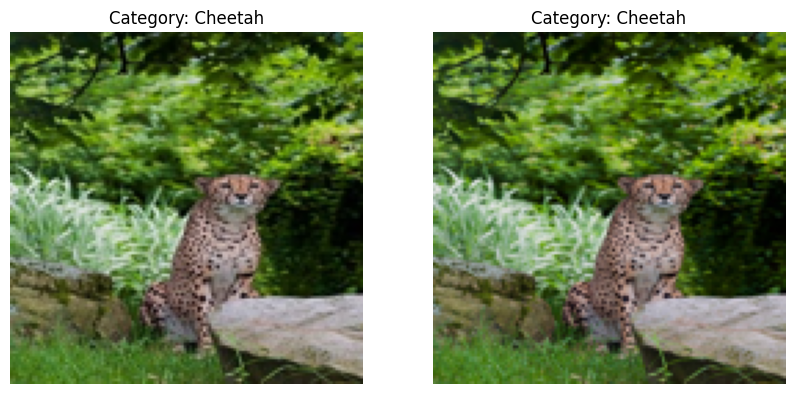

Pair  2 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Jaguar/photo-1477949775154-d739b82400b3 (1).jpg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Jaguar/photo-1477949775154-d739b82400b3.jpg


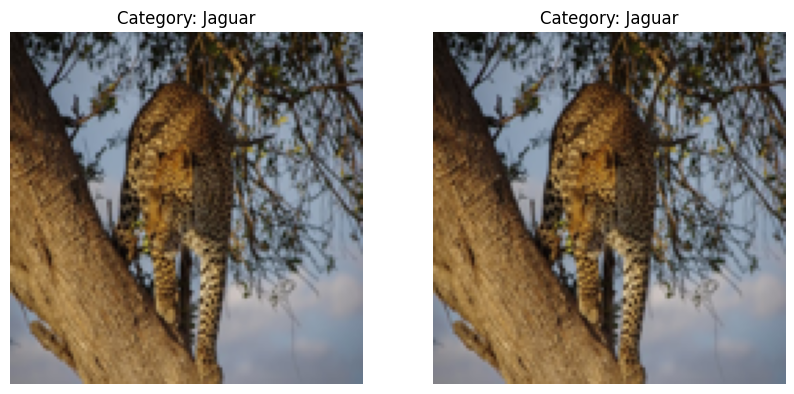

Pair  3 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Jaguar/pexels-photo-4468189 (1).jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Jaguar/pexels-photo-4468189.jpeg


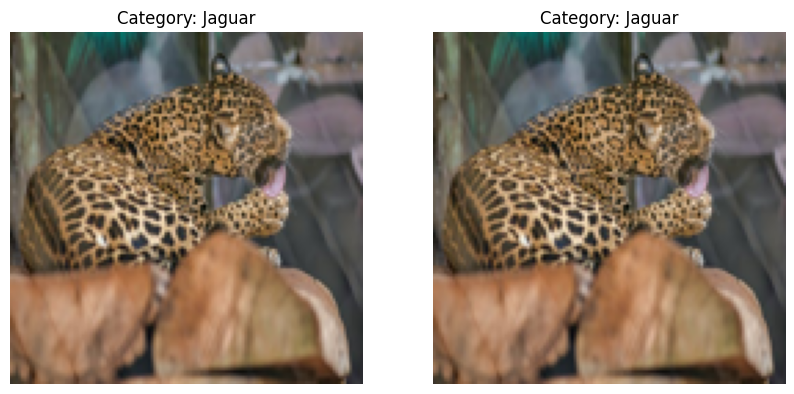

Pair  4 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/pexels-photo-1109898.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/pexels-photo-1109898.jpeg


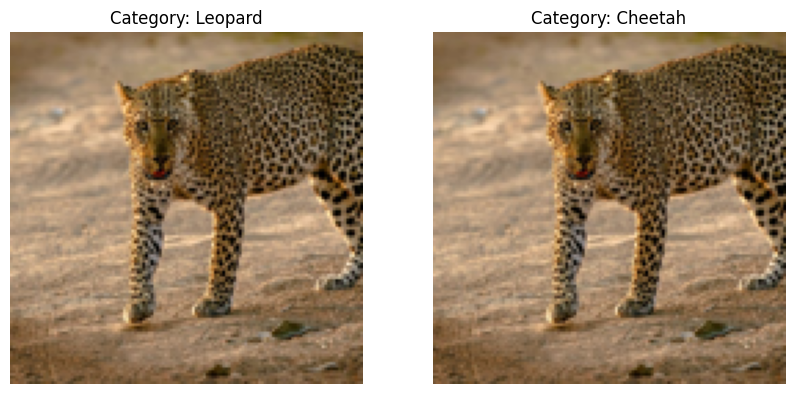

Pair  5 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/leopard-wildcat-big-cat-botswana-46790.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/leopard-wildcat-big-cat-botswana-46790.jpeg


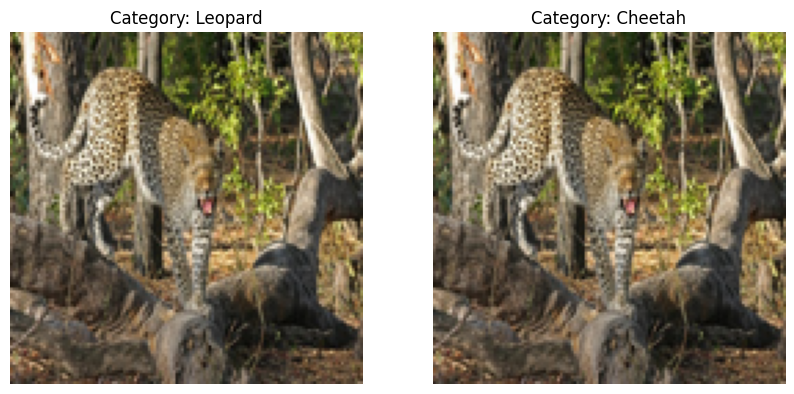

Pair  6 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/pexels-photo-88234.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/pexels-photo-88234.jpeg


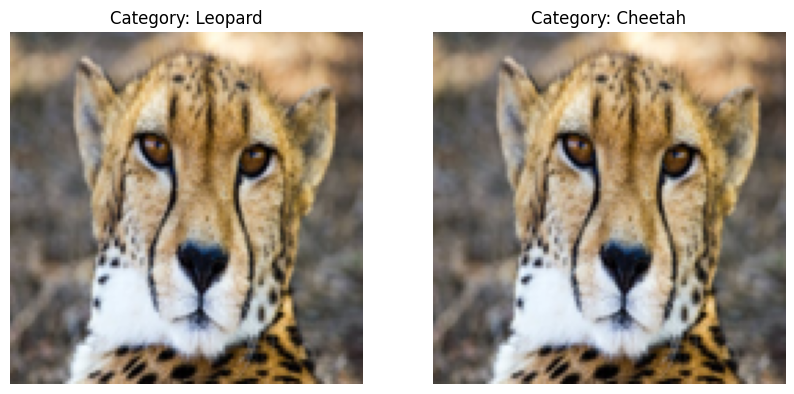

Pair  7 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/pexels-photo-7018141.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/pexels-photo-7018141.jpeg


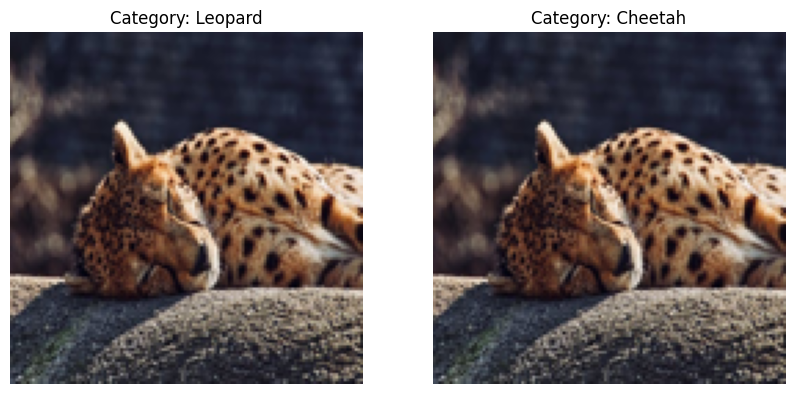

Pair  8 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/photo-1541893321-dcc3e4dcb6dc.jpg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Jaguar/photo-1541893321-dcc3e4dcb6dc.jpg


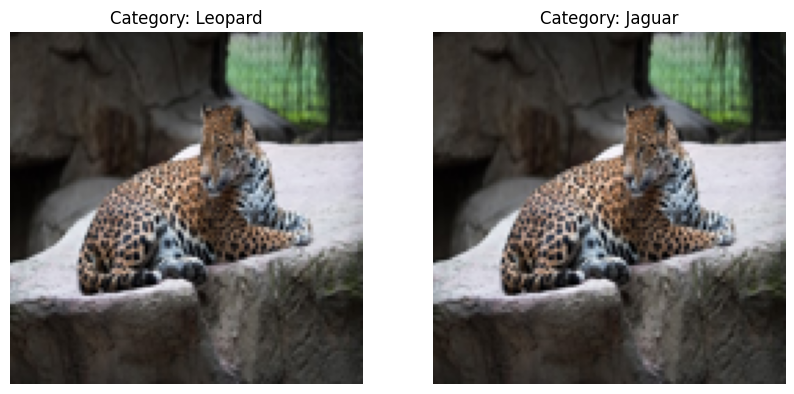

Pair  9 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Tiger/panthera-tigris-altaica-tiger-siberian-amurtiger-162173.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Tiger/panthera-tigris-altaica-tiger-siberian-amurtiger-162203.jpeg


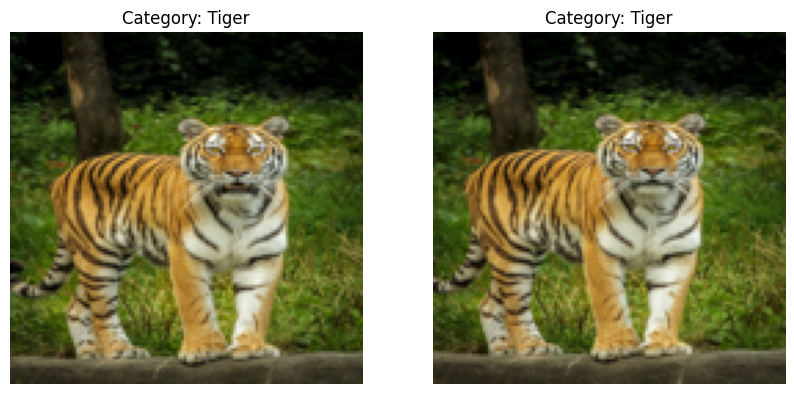

Pair  10 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Tiger/pexels-photo-145899.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Tiger/pexels-photo-145899 (1).jpeg


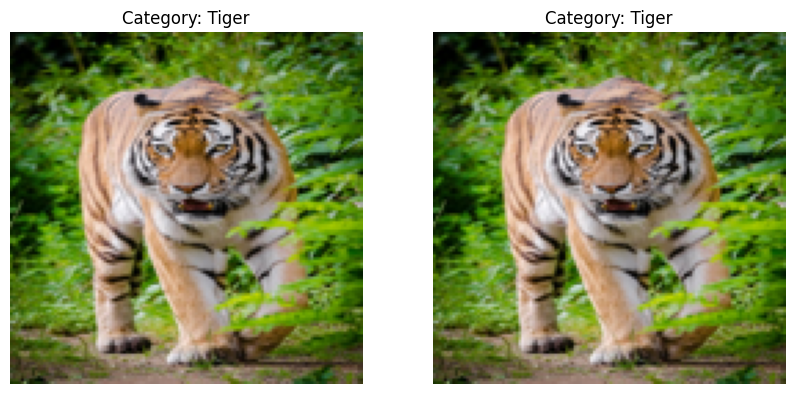

Pair  1 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Cheetah/cheetah-223734__340.jpg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/cheetah-predator-wild-animal-speed-59952.jpeg


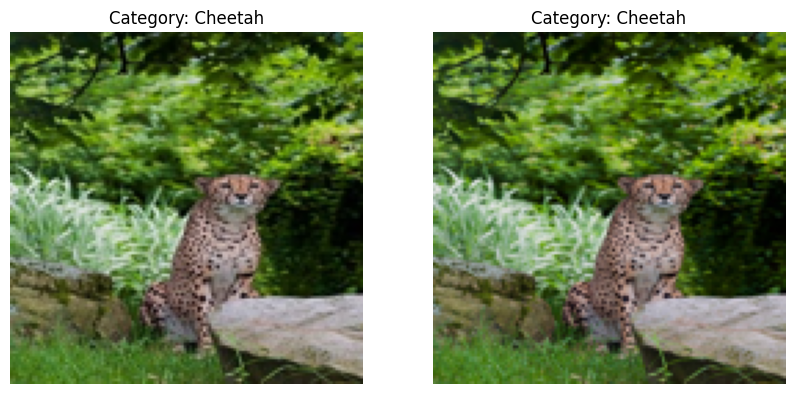

Pair  2 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Jaguar/photo-1477949775154-d739b82400b3 (1).jpg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Jaguar/photo-1477949775154-d739b82400b3.jpg


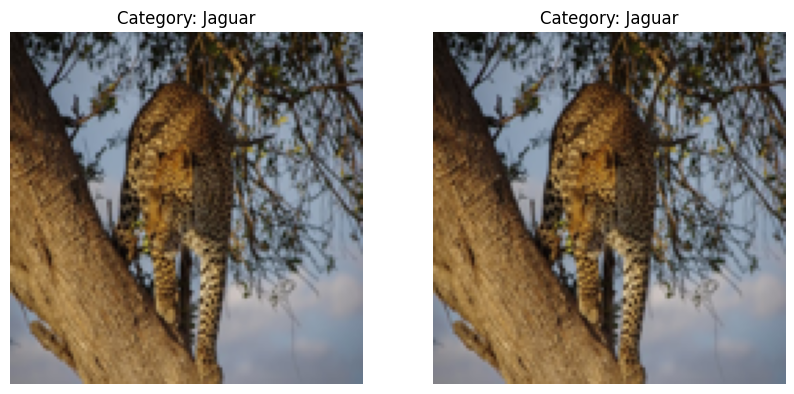

Pair  3 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Jaguar/pexels-photo-4468189 (1).jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Jaguar/pexels-photo-4468189.jpeg


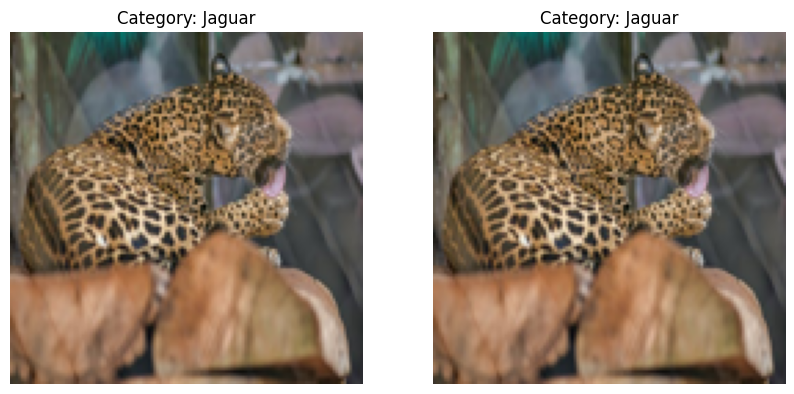

Pair  4 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/pexels-photo-1109898.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/pexels-photo-1109898.jpeg


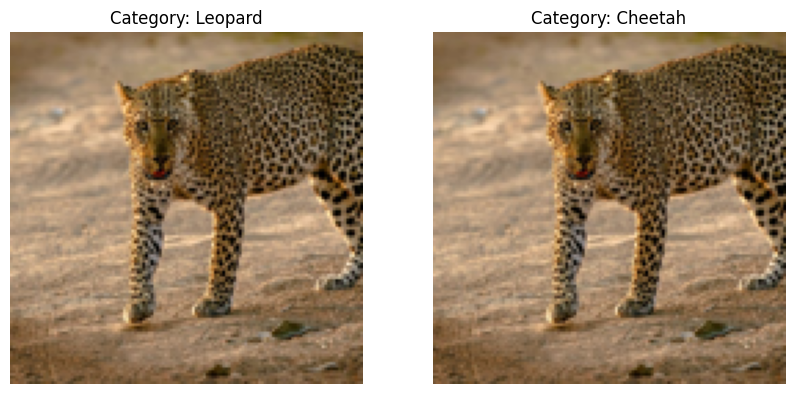

Pair  5 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/leopard-wildcat-big-cat-botswana-46790.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/leopard-wildcat-big-cat-botswana-46790.jpeg


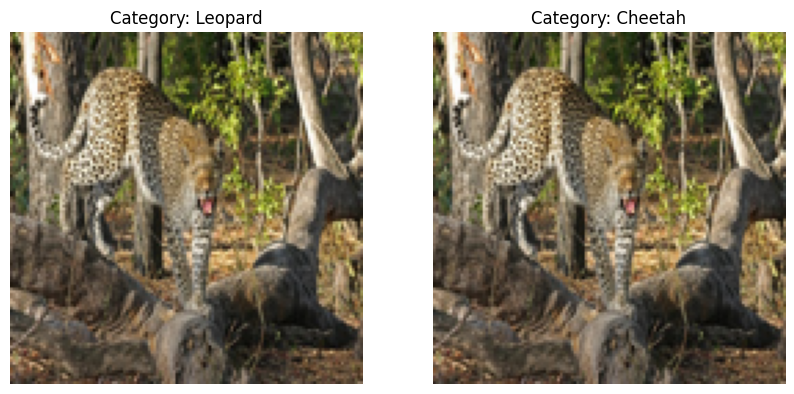

Pair  6 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/pexels-photo-88234.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/pexels-photo-88234.jpeg


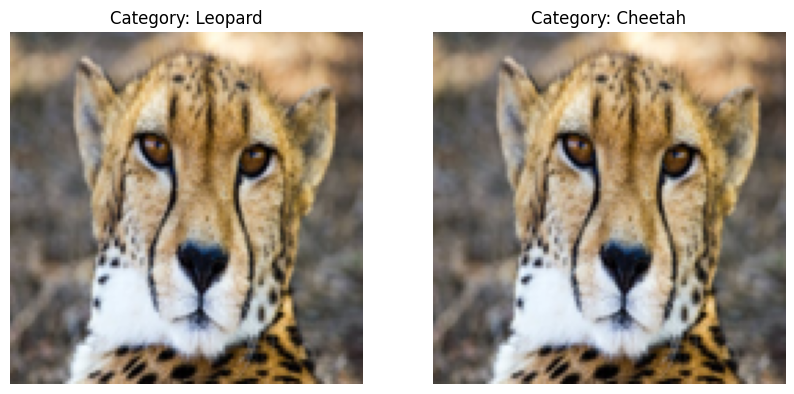

Pair  7 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/pexels-photo-7018141.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Cheetah/pexels-photo-7018141.jpeg


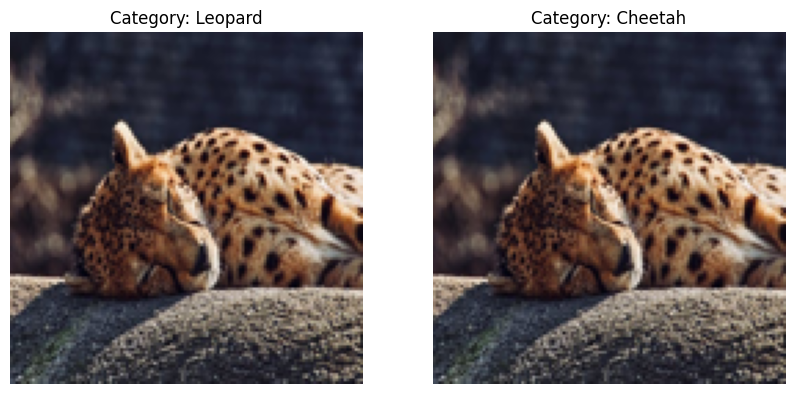

Pair  8 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Leopard/photo-1541893321-dcc3e4dcb6dc.jpg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Jaguar/photo-1541893321-dcc3e4dcb6dc.jpg


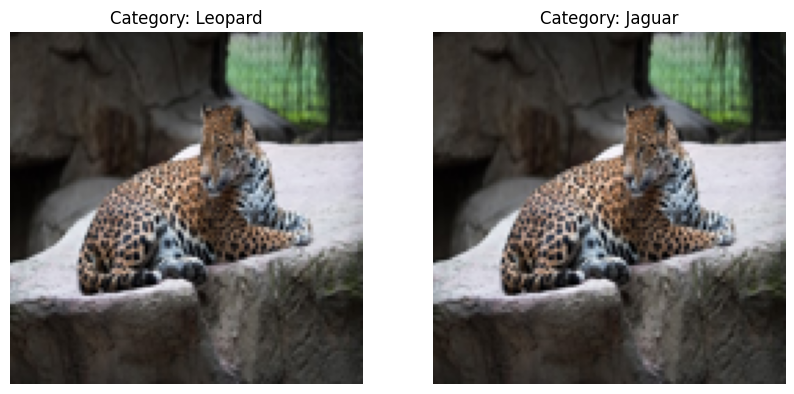

Pair  9 :
Duplicate 1 Path: /content/drive/MyDrive/BigCats/Tiger/pexels-photo-145899.jpeg
Duplicate 2 Path: /content/drive/MyDrive/BigCats/Tiger/pexels-photo-145899 (1).jpeg


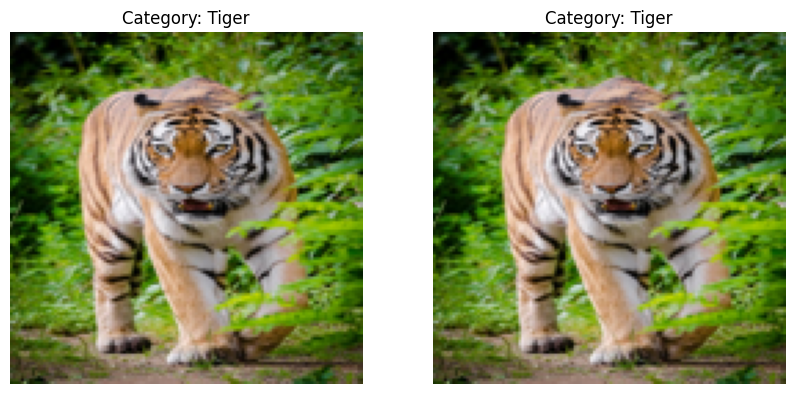

In [5]:
#%% Find and Remove Duplicates

# Find duplicates
duplicates = find_duplicate_images(dataset_path, categories)
# Plot duplicates
plot_duplicate_images(duplicates, image_paths, labels, categories)
# Pair 9 is not duplicated; remove it from duplicates list
duplicates.pop(8)
# Re-Plot duplicates
plot_duplicate_images(duplicates, image_paths, labels, categories)
# Create a set to keep track of indices to remove
indices_to_remove = set()
# Add duplicate indices to set
for dup in duplicates:
    dup1_path, dup2_path = dup
    # Get the indices of each duplicate in the image_paths list
    dup1_index = image_paths.index(dup1_path)
    dup2_index = image_paths.index(dup2_path)
    if labels[dup1_index] == labels[dup2_index]:
        # If both are in the same category, mark the second one for removal
        indices_to_remove.add(dup2_index)
    else:
        # If they are in different categories, mark both for removal
        indices_to_remove.add(dup1_index)
        indices_to_remove.add(dup2_index)

# Create new lists without duplicates
images_cleaned = np.array([img for i, img in enumerate(images) if i not in indices_to_remove])
labels_cleaned = np.array([label for i, label in enumerate(labels) if i not in indices_to_remove])
image_paths_cleaned = [path for i, path in enumerate(image_paths) if i not in indices_to_remove]


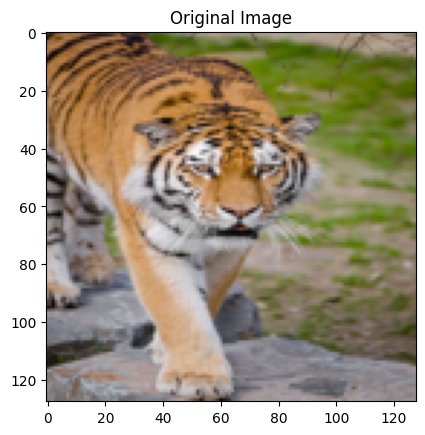

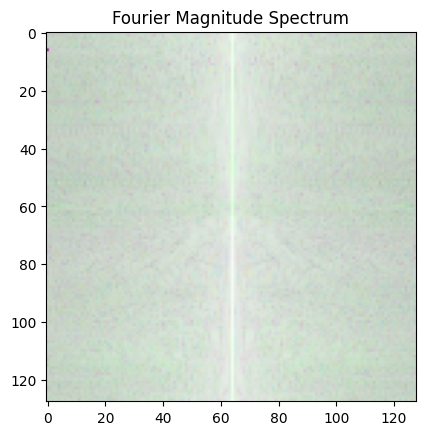

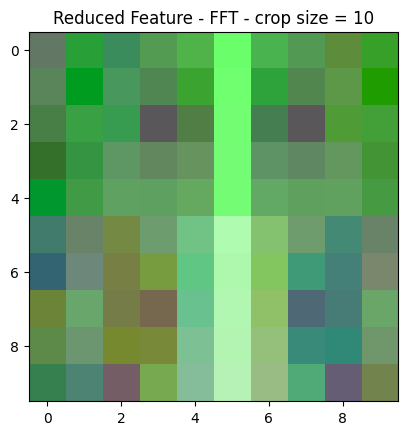

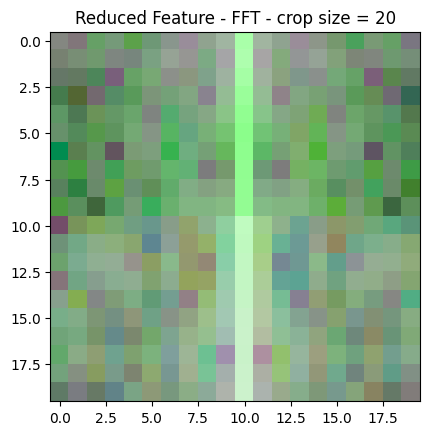

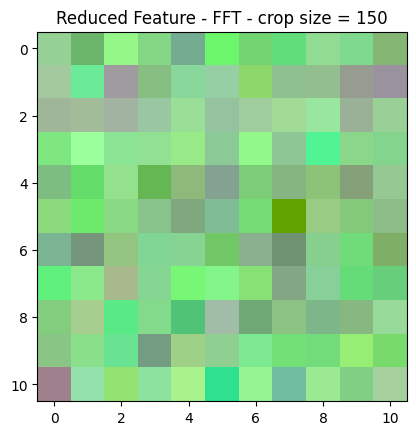

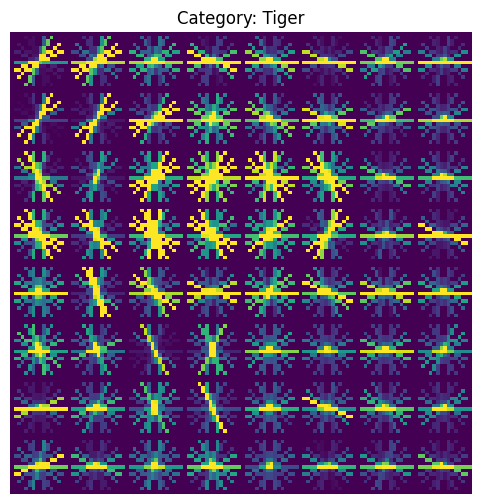

In [6]:
#%% Flattening + FFT + HoG

# Flattening for all images
flattened_images = flatten_image_set(images_cleaned)

# Compute Fourier Transform magnitude for all images
fft_feat = fft_image_set(images_cleaned, crop_size=None)
# Apply HOG
hog_feat, hog_images = apply_hog(images_cleaned)

# Visualize Transforms
index = np.random.randint(0,len(hog_images))
reduce_fft_features(compute_fft_magnitude(images_cleaned[index], flatten=False, plot_img=True, plot_fft=True), 10, plot_fft=True, flatten=False)
reduce_fft_features(compute_fft_magnitude(images_cleaned[index], flatten=False, plot_img=False, plot_fft=False), 20, plot_fft=True, flatten=False)
reduce_fft_features(compute_fft_magnitude(images_cleaned[index], flatten=False, plot_img=False, plot_fft=False), 150, plot_fft=True, flatten=False)
plot_image(index, hog_images, labels_cleaned, categories)


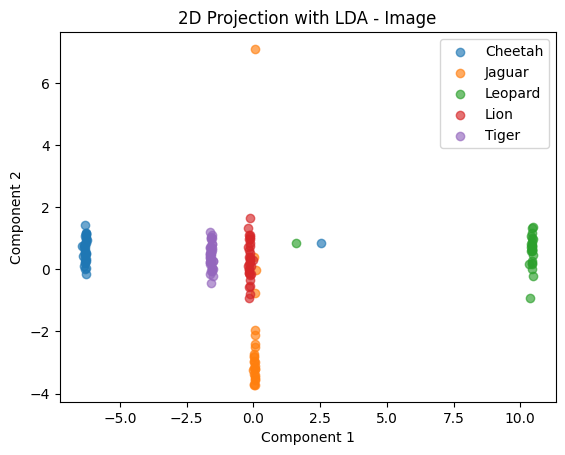

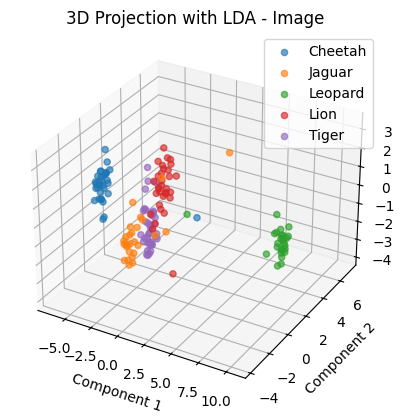

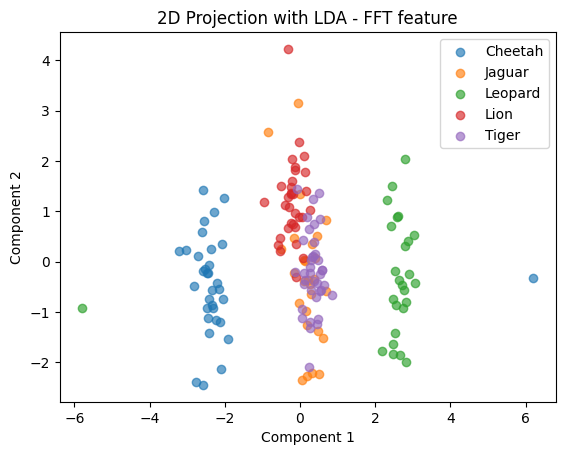

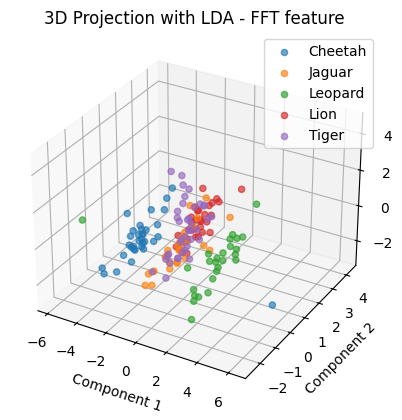

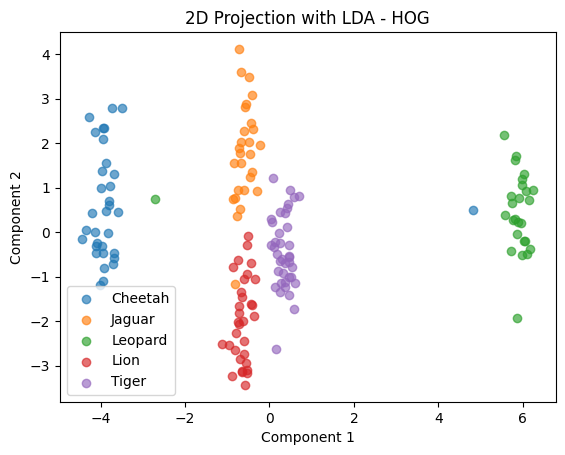

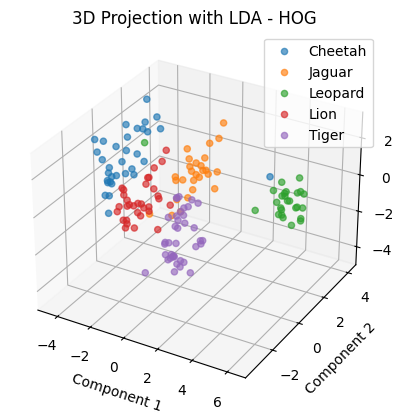

In [7]:

#%% Visualization with LDA

## (for images)
# Linear Discriminant Analysis
lda_image = LinearDiscriminantAnalysis()
images_lda = lda_image.fit_transform(flattened_images, labels_cleaned)
plot_2d_projection(images_lda[:,0:2], labels_cleaned, categories, method_name='LDA - Image')
plot_3d_projection(images_lda[:,0:3], labels_cleaned, categories, method_name='LDA - Image')

## (for FFT features)
# Linear Discriminant Analysis
lda_fft = LinearDiscriminantAnalysis()
fft_lda = lda_fft.fit_transform(fft_feat, labels_cleaned)
plot_2d_projection(fft_lda[:,0:2], labels_cleaned, categories, method_name='LDA - FFT feature')
plot_3d_projection(fft_lda[:,0:3], labels_cleaned, categories, method_name='LDA - FFT feature')

## (for Hog Features)
# Linear Discriminant Analysis
lda_hog = LinearDiscriminantAnalysis()
hog_lda = lda_hog.fit_transform(hog_feat, labels_cleaned)
plot_2d_projection(hog_lda[:,0:2], labels_cleaned, categories, method_name='LDA - HOG')
plot_3d_projection(hog_lda[:,0:3], labels_cleaned, categories, method_name='LDA - HOG')

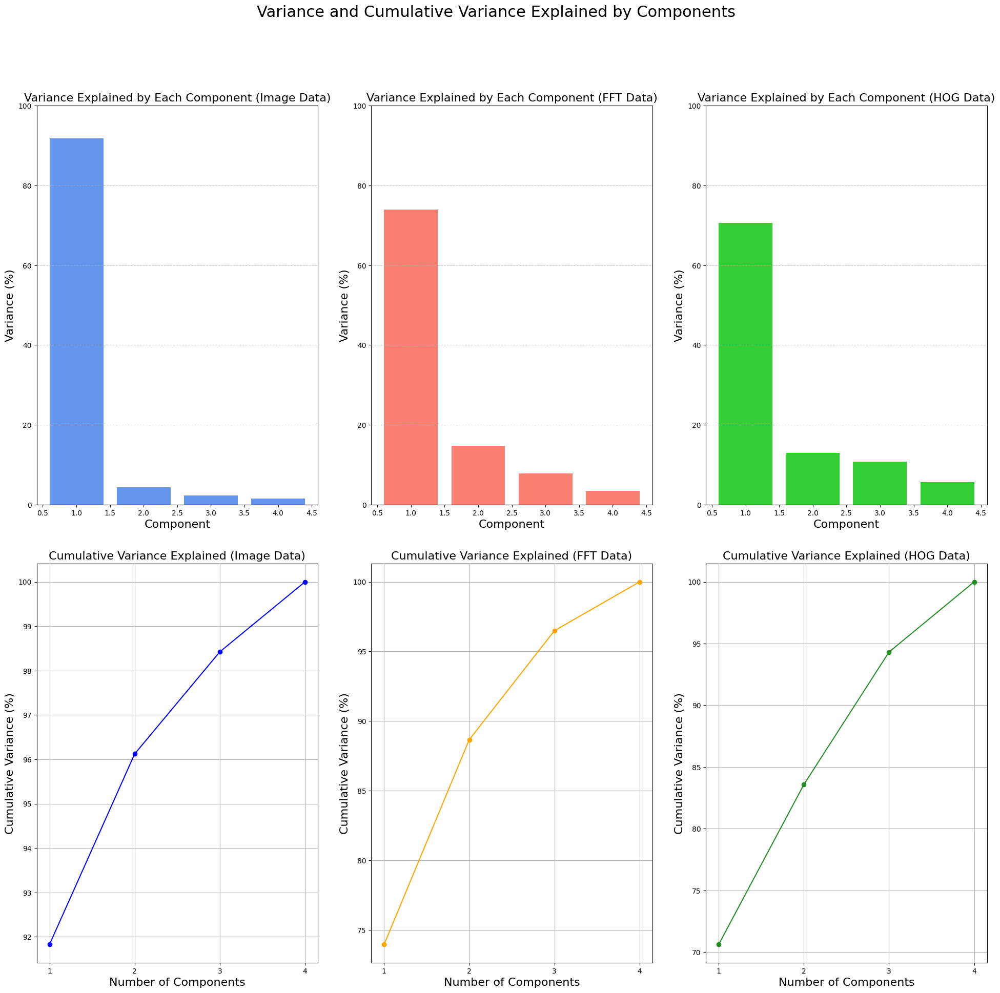

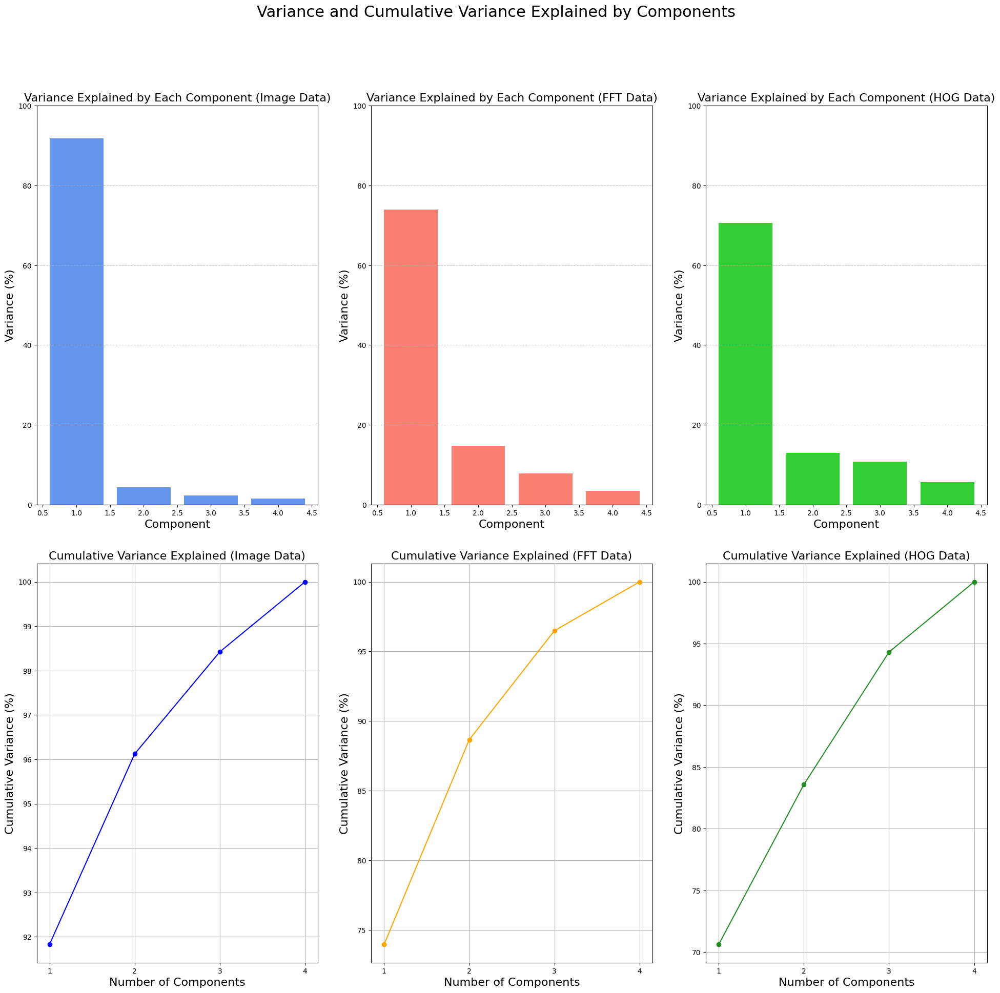

In [8]:
#%% Find explained variance with each component

# Get the explained variance ratio
explained_variance_ratio_image = lda_image.explained_variance_ratio_
explained_variance_ratio_frequency = lda_fft.explained_variance_ratio_
explained_variance_ratio_hog = lda_hog.explained_variance_ratio_

# Cumulative variance
cumulative_variance_image = np.cumsum(explained_variance_ratio_image)
cumulative_variance_frequency = np.cumsum(explained_variance_ratio_frequency)
cumulative_variance_hog = np.cumsum(explained_variance_ratio_hog)

# Create subplots
plt.figure(figsize=(20, 20))
plt.suptitle('Variance and Cumulative Variance Explained by Components', fontsize=22)
# Subplot for variance explained by image data
plt.subplot(231)
plt.bar(range(1, len(explained_variance_ratio_image) + 1), explained_variance_ratio_image * 100, color='cornflowerblue')
plt.xlabel('Component', fontsize=16)
plt.ylabel('Variance (%)', fontsize=16)
plt.title('Variance Explained by Each Component (Image Data)', fontsize=16)
plt.ylim(0, 100)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Subplot for variance explained by FFT data
plt.subplot(232)
plt.bar(range(1, len(explained_variance_ratio_frequency) + 1), explained_variance_ratio_frequency * 100, color='salmon')
plt.xlabel('Component', fontsize=16)
plt.ylabel('Variance (%)', fontsize=16)
plt.title('Variance Explained by Each Component (FFT Data)', fontsize=16)
plt.ylim(0, 100)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Subplot for variance explained by HOG data
plt.subplot(233)
plt.bar(range(1, len(explained_variance_ratio_hog) + 1), explained_variance_ratio_hog * 100, color='limegreen')
plt.xlabel('Component', fontsize=16)
plt.ylabel('Variance (%)', fontsize=16)
plt.title('Variance Explained by Each Component (HOG Data)', fontsize=16)
plt.ylim(0, 100)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Subplot for cumulative variance explained by image data
plt.subplot(234)
plt.plot(range(1, len(cumulative_variance_image) + 1), cumulative_variance_image * 100, marker='o', linestyle='-', color='blue')
plt.xlabel('Number of Components', fontsize=16)
plt.ylabel('Cumulative Variance (%)', fontsize=16)
plt.title('Cumulative Variance Explained (Image Data)', fontsize=16)
plt.xticks(range(1, len(cumulative_variance_image) + 1))  # Show all x-ticks
plt.grid(True)
# Subplot for cumulative variance explained by FFT data
plt.subplot(235)
plt.plot(range(1, len(cumulative_variance_frequency) + 1), cumulative_variance_frequency * 100, marker='o', linestyle='-', color='orange')
plt.xlabel('Number of Components', fontsize=16)
plt.ylabel('Cumulative Variance (%)', fontsize=16)
plt.title('Cumulative Variance Explained (FFT Data)', fontsize=16)
plt.xticks(range(1, len(cumulative_variance_frequency) + 1))  # Show all x-ticks
plt.grid(True)
# Subplot for cumulative variance explained by HOG data
plt.subplot(236)
plt.plot(range(1, len(cumulative_variance_hog) + 1), cumulative_variance_hog * 100, marker='o', linestyle='-', color='forestgreen')
plt.xlabel('Number of Components', fontsize=16)
plt.ylabel('Cumulative Variance (%)', fontsize=16)
plt.title('Cumulative Variance Explained (HOG Data)', fontsize=16)
plt.xticks(range(1, len(cumulative_variance_frequency) + 1))  # Show all x-ticks
plt.grid(True)

# Adjust layout to improve spacing
plt.tight_layout(rect=[0, 0, 1, 0.95], pad=3.0)  # Keep space for the suptitle
plt.show()

# Get the explained variance ratio
explained_variance_ratio_image = lda_image.explained_variance_ratio_
explained_variance_ratio_frequency = lda_fft.explained_variance_ratio_
explained_variance_ratio_hog = lda_hog.explained_variance_ratio_

# Cumulative variance
cumulative_variance_image = np.cumsum(explained_variance_ratio_image)
cumulative_variance_frequency = np.cumsum(explained_variance_ratio_frequency)
cumulative_variance_hog = np.cumsum(explained_variance_ratio_hog)

# Create subplots
plt.figure(figsize=(20, 20))
plt.suptitle('Variance and Cumulative Variance Explained by Components', fontsize=22)
# Subplot for variance explained by image data
plt.subplot(231)
plt.bar(range(1, len(explained_variance_ratio_image) + 1), explained_variance_ratio_image * 100, color='cornflowerblue')
plt.xlabel('Component', fontsize=16)
plt.ylabel('Variance (%)', fontsize=16)
plt.title('Variance Explained by Each Component (Image Data)', fontsize=16)
plt.ylim(0, 100)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Subplot for variance explained by FFT data
plt.subplot(232)
plt.bar(range(1, len(explained_variance_ratio_frequency) + 1), explained_variance_ratio_frequency * 100, color='salmon')
plt.xlabel('Component', fontsize=16)
plt.ylabel('Variance (%)', fontsize=16)
plt.title('Variance Explained by Each Component (FFT Data)', fontsize=16)
plt.ylim(0, 100)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Subplot for variance explained by HOG data
plt.subplot(233)
plt.bar(range(1, len(explained_variance_ratio_hog) + 1), explained_variance_ratio_hog * 100, color='limegreen')
plt.xlabel('Component', fontsize=16)
plt.ylabel('Variance (%)', fontsize=16)
plt.title('Variance Explained by Each Component (HOG Data)', fontsize=16)
plt.ylim(0, 100)  # Set y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Subplot for cumulative variance explained by image data
plt.subplot(234)
plt.plot(range(1, len(cumulative_variance_image) + 1), cumulative_variance_image * 100, marker='o', linestyle='-', color='blue')
plt.xlabel('Number of Components', fontsize=16)
plt.ylabel('Cumulative Variance (%)', fontsize=16)
plt.title('Cumulative Variance Explained (Image Data)', fontsize=16)
plt.xticks(range(1, len(cumulative_variance_image) + 1))  # Show all x-ticks
plt.grid(True)
# Subplot for cumulative variance explained by FFT data
plt.subplot(235)
plt.plot(range(1, len(cumulative_variance_frequency) + 1), cumulative_variance_frequency * 100, marker='o', linestyle='-', color='orange')
plt.xlabel('Number of Components', fontsize=16)
plt.ylabel('Cumulative Variance (%)', fontsize=16)
plt.title('Cumulative Variance Explained (FFT Data)', fontsize=16)
plt.xticks(range(1, len(cumulative_variance_frequency) + 1))  # Show all x-ticks
plt.grid(True)
# Subplot for cumulative variance explained by HOG data
plt.subplot(236)
plt.plot(range(1, len(cumulative_variance_hog) + 1), cumulative_variance_hog * 100, marker='o', linestyle='-', color='forestgreen')
plt.xlabel('Number of Components', fontsize=16)
plt.ylabel('Cumulative Variance (%)', fontsize=16)
plt.title('Cumulative Variance Explained (HOG Data)', fontsize=16)
plt.xticks(range(1, len(cumulative_variance_frequency) + 1))  # Show all x-ticks
plt.grid(True)
# Adjust layout to improve spacing
plt.tight_layout(rect=[0, 0, 1, 0.95], pad=3.0)  # Keep space for the suptitle
plt.show()


In [9]:
#%% Perform Fuzzy C Means on full Image dataset

# Define the number of clusters (you can change this based on your use case)
n_clusters = 5

# Transpose the data as skfuzzy expects features in rows, not columns
flattened_images_transposed = flattened_images.T

# Perform Fuzzy C-Means clustering
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    flattened_images_transposed, n_clusters, m=2, error=0.005, maxiter=1000, init=None)

# u: fuzzy membership matrix
# cntr: cluster centers
# d: distances between points and centers
# jm: objective function history
# p: number of iterations
# fpc: fuzzy partition coefficient (goodness of fit)

# To assign a cluster to each point, we take the index of the maximum membership value for each point
cluster_membership = np.argmax(u, axis=0)

# Print the cluster centers and membership for the training data
print(f"Cluster Centers:\n{cntr}")
print(f"Cluster Memberships:\n{cluster_membership}")
print(f"Fuzzy Partition Coefficient (FPC): {round(fpc,4)}")

Cluster Centers:
[[87.80563034 88.14213959 69.83333789 ... 82.17664585 80.15058573
  58.91866779]
 [94.76638075 94.65670816 75.67739183 ... 87.60425949 85.07529858
  63.02604983]
 [91.3022522  91.4232673  72.7699623  ... 84.9035786  82.64379575
  60.98423119]
 [90.48727404 90.66060917 72.08601791 ... 84.26096159 82.05963926
  60.49616364]
 [88.42723519 88.72661263 70.35555038 ... 82.66609315 80.60108102
  59.29100814]]
Cluster Memberships:
[1 3 1 1 0 0 3 1 0 0 0 1 1 0 1 1 1 1 0 0 1 0 0 1 1 2 0 1 0 1 1 1 1 1 0 0 0
 0 0 0 4 1 1 2 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 3 1 0 0 0 0 1 1 0 1 1 0 1 3
 1 0 1 1 1 1 0 1 0 0 1 1 1 0 1 0 0 1 0 1 1 1 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0
 0 1 0 1 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 2 0 0 1 1 0 0 1 0 0 1 2 4 1
 1 1 1 0 1 1 1 0]
Fuzzy Partition Coefficient (FPC): 0.2002


Evaluating FFT pipeline: 2 clusters, crop size 5
Evaluating FFT pipeline: 2 clusters, crop size 10
Evaluating FFT pipeline: 2 clusters, crop size 15
Evaluating FFT pipeline: 2 clusters, crop size 20
Evaluating FFT pipeline: 2 clusters, crop size 25
Evaluating FFT pipeline: 2 clusters, crop size 30
Evaluating FFT pipeline: 2 clusters, crop size 35
Evaluating FFT pipeline: 2 clusters, crop size 40
Evaluating FFT pipeline: 2 clusters, crop size 45
Evaluating FFT pipeline: 2 clusters, crop size 50
Evaluating FFT pipeline: 2 clusters, crop size None
Evaluating FFT pipeline: 3 clusters, crop size 5
Evaluating FFT pipeline: 3 clusters, crop size 10
Evaluating FFT pipeline: 3 clusters, crop size 15
Evaluating FFT pipeline: 3 clusters, crop size 20
Evaluating FFT pipeline: 3 clusters, crop size 25
Evaluating FFT pipeline: 3 clusters, crop size 30
Evaluating FFT pipeline: 3 clusters, crop size 35
Evaluating FFT pipeline: 3 clusters, crop size 40
Evaluating FFT pipeline: 3 clusters, crop size 45


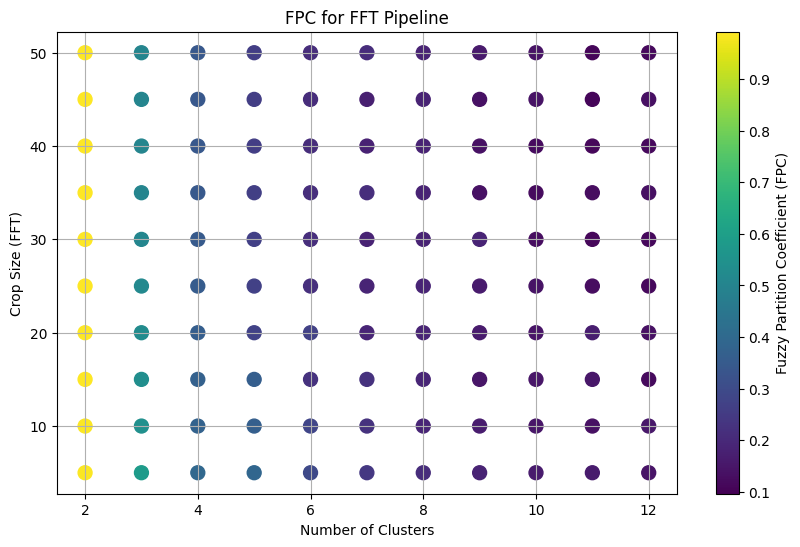

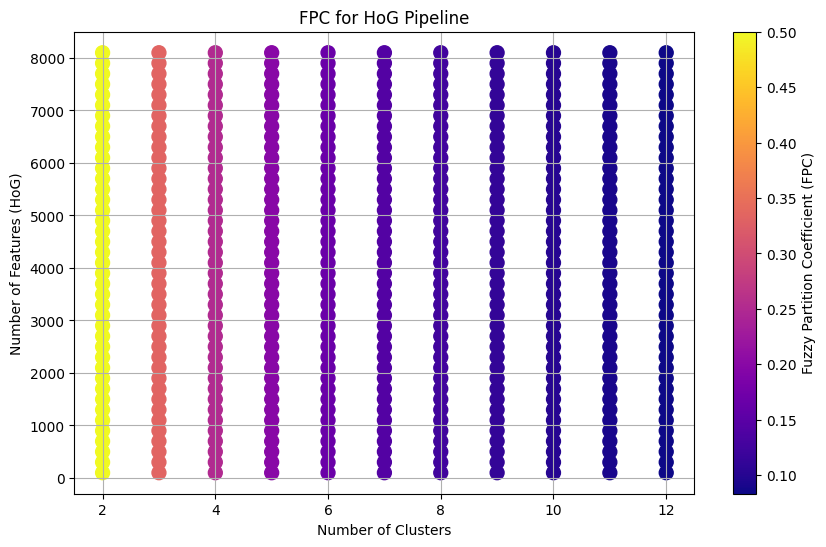

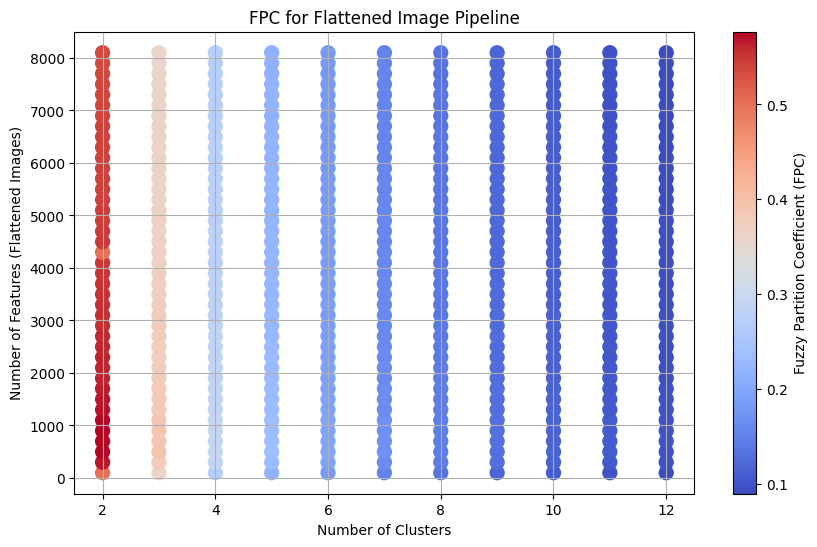

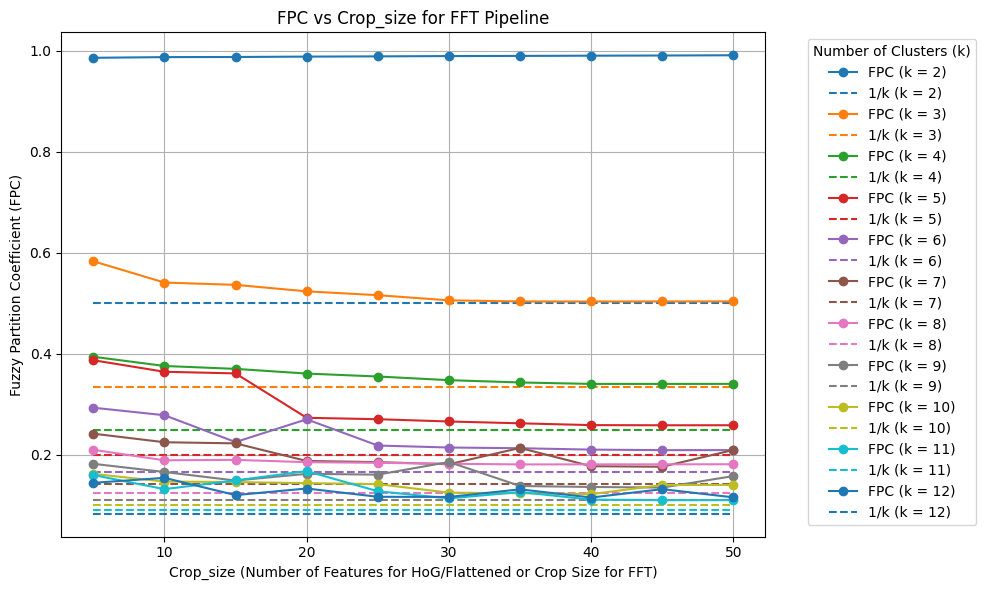

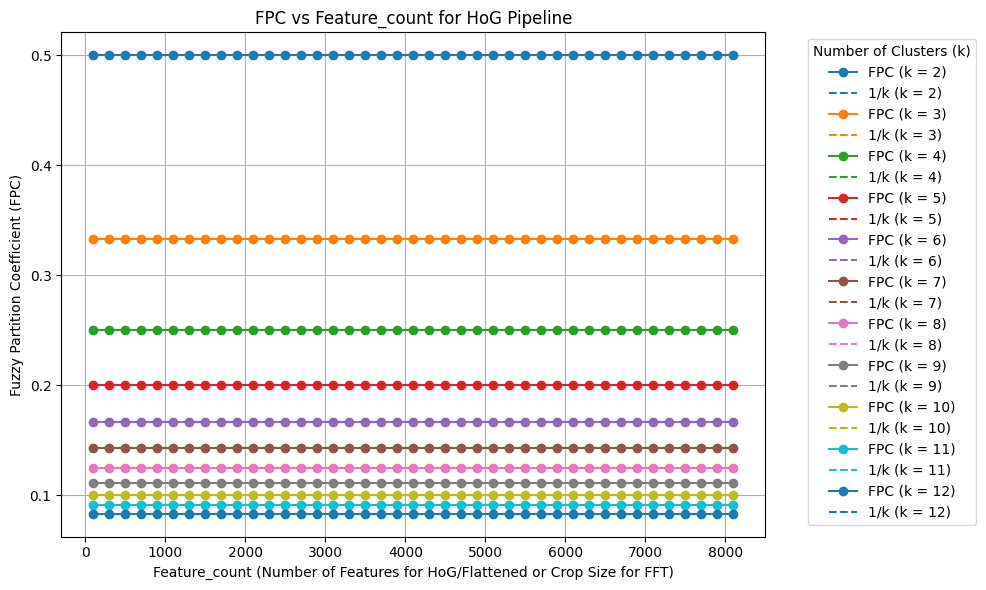

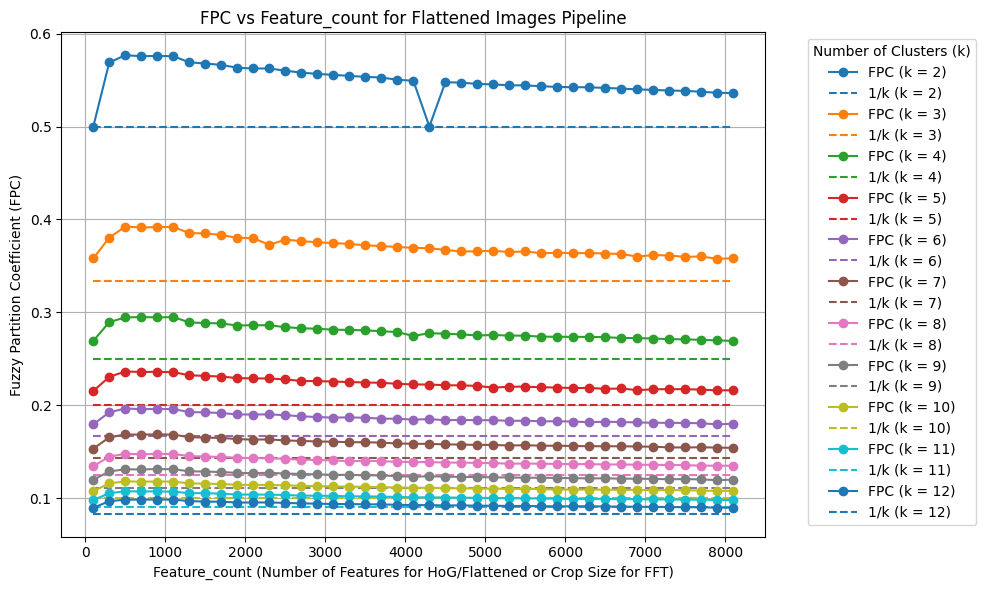

Best Configuration Based on FPC:
Pipeline: FFT
Crop Size: 50
Number of Clusters (k): 2
FPC: 0.9914
Percentage Increase: 98.27%

Best Configuration Based on Percentage Increase:
Pipeline: FFT
Crop Size: 50
Number of Clusters (k): 2
FPC: 0.9914
Percentage Increase: 98.27%
Best Configuration for k=12 Based on FPC:
Pipeline: FFT
Crop Size: 10
FPC: 0.1543
Percentage Increase: 85.14%

Best Configuration for k=12 Based on Percentage Increase:
Pipeline: FFT
Crop Size: 10
FPC: 0.1543
Percentage Increase: 85.14%


In [10]:
#%% Tune number of clusters, data form (Image, HoG, or FFT), and Selected Features (ANOVA, LDA, or Low-Pass Cropping)

n_cluster_grid = [2,3,4,5,6,7,8,9,10,11,12]
feature_grid = list(np.arange(100,8100,200))
feature_grid.append(8100) # for when feature selection isn't performed
crop_size_grid = list(np.arange(5,51,5)) # 5 to 50 with step 5
crop_size_grid.append(None) # for no cropping

# Apply HOG earlier
hog_features, hog_images = apply_hog(images_cleaned)
# Run Parameter Tuning with Fuzzy C-Means
results = evaluate_fcm_pipelines(hog_features, images_cleaned, labels_cleaned, n_cluster_grid, feature_grid, crop_size_grid)

# Visualize Results
plot_fpc_results(results)
plot_fpc_vs_features_or_crop(results)
best_fpc, best_increase = find_best_configuration(results)

# Best result for specific number of clusters
best_fpc_result_k3, best_increase_result_k3 = find_best_configuration_for_k(results, 12)


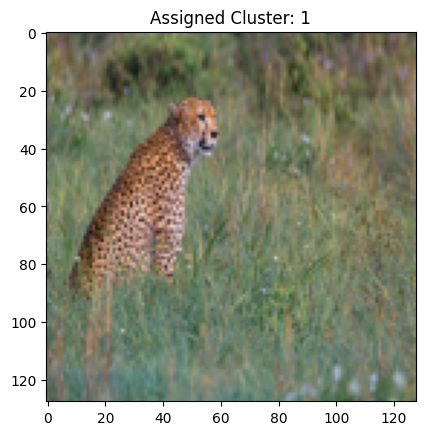

Cluster 0: 2 images
Cluster 1: 154 images


[2, 154]

In [11]:
#%% Best Parameter Vector

# Use the best configuration to compute FFT features and perform clustering
fft_features_best = fft_image_set(images_cleaned, crop_size=50)
# Perform Fuzzy C-Means on the FFT features (with 2 clusters)
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    fft_features_best.T, 2, m=2, error=0.005, maxiter=1000, init=None)
# Get the cluster membership for each image
cluster_membership = np.argmax(u, axis=0)
# Plot a random image along with its assigned cluster
plot_random_image_with_cluster(images_cleaned, fft_features_best, cntr, u, cluster_membership)
# Count the number of images in each cluster (for 2 clusters)
count_images_per_cluster(cluster_membership, 2)

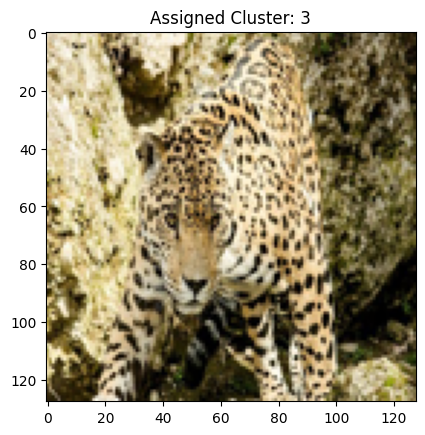

Cluster 0: 47 images
Cluster 1: 2 images
Cluster 2: 1 images
Cluster 3: 66 images
Cluster 4: 40 images
Adjusted Mutual Information: -0.0118
Normalized Mutual Information: 0.0250


In [12]:
#%% For 5 Clusters

# Use the best configuration for 5 clusters
fft_features_best = fft_image_set(images_cleaned, crop_size=5)
# Perform Fuzzy C-Means on the FFT features (with 5 clusters)
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    fft_features_best.T, 5, m=2, error=0.005, maxiter=1000, init=None)
# Get the cluster membership for each image
cluster_membership = np.argmax(u, axis=0)
# Plot a random image along with its assigned cluster
plot_random_image_with_cluster(images_cleaned, fft_features_best, cntr, u, cluster_membership)
# Count the number of images in each cluster (for 5 clusters)
count_images_per_cluster(cluster_membership, 5)
# Assign class to cluster
assign_classes_to_clusters(cluster_membership, labels_cleaned, 5, 5)

## Mutual Information Values for 5 clusters
# Calculate Adjusted Mutual Information
ami = adjusted_mutual_info_score(labels_cleaned, cluster_membership)
print(f"Adjusted Mutual Information: {ami:.4f}")
# Calculate Normalized Mutual Information
nmi = normalized_mutual_info_score(labels_cleaned, cluster_membership)
print(f"Normalized Mutual Information: {nmi:.4f}")

In [ ]:
#%% Tune but this time record normalized mutual information by also considering the labels

n_cluster_grid = [2,3,4,5,6,7,8,9,10,11,12]
feature_grid = list(np.arange(100,8100,200))
feature_grid.append(8100) # for when feature selection isn't performed
crop_size_grid = list(np.arange(5,51,5)) # 5 to 50 with step 5
crop_size_grid.append(None) # for no cropping

# Apply HOG earlier
hog_features, hog_images = apply_hog(images_cleaned)
# Run Parameter Tuning with Fuzzy C-Means
results_ = evaluate_fcm_pipelines_with_nmi(hog_features, images_cleaned, labels_cleaned, n_cluster_grid, feature_grid, crop_size_grid)

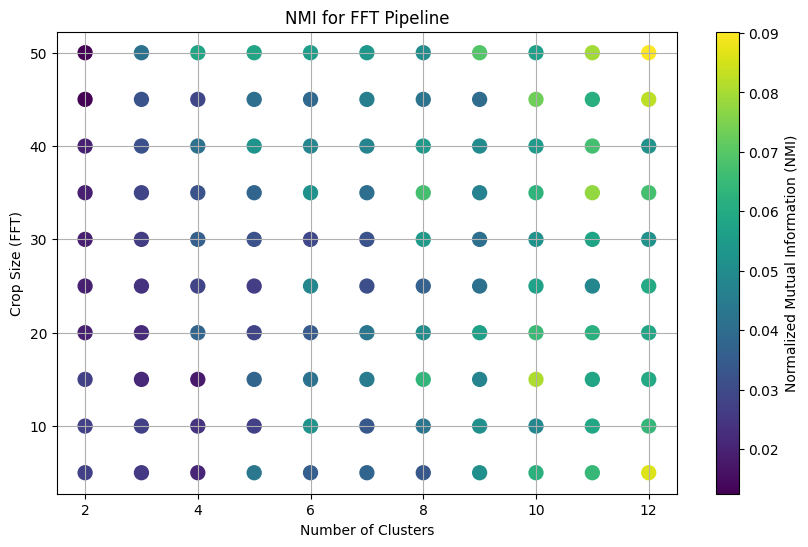

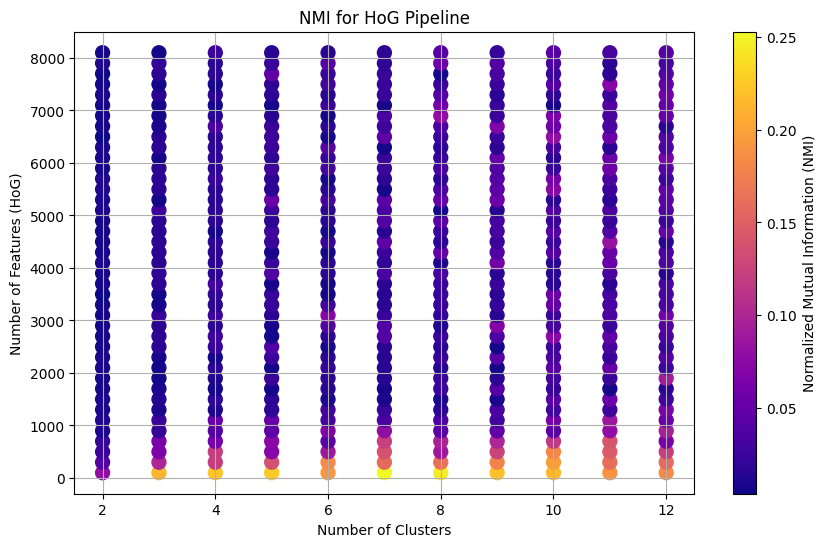

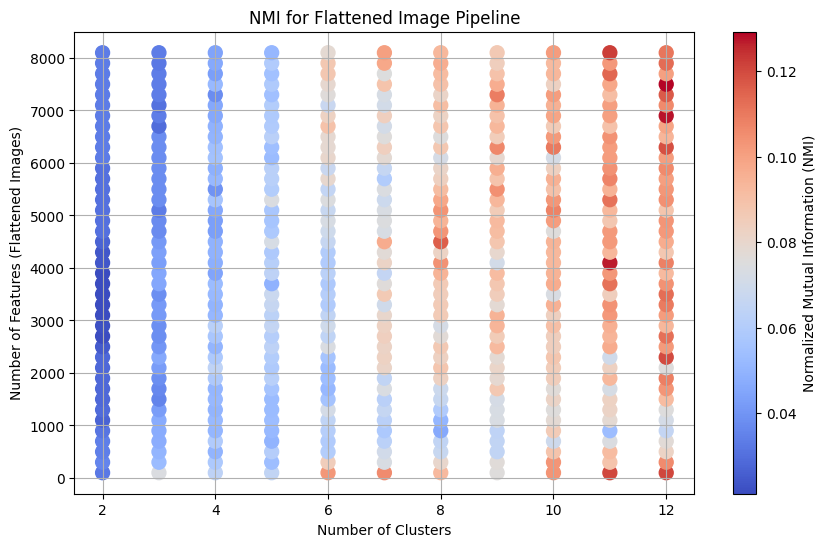

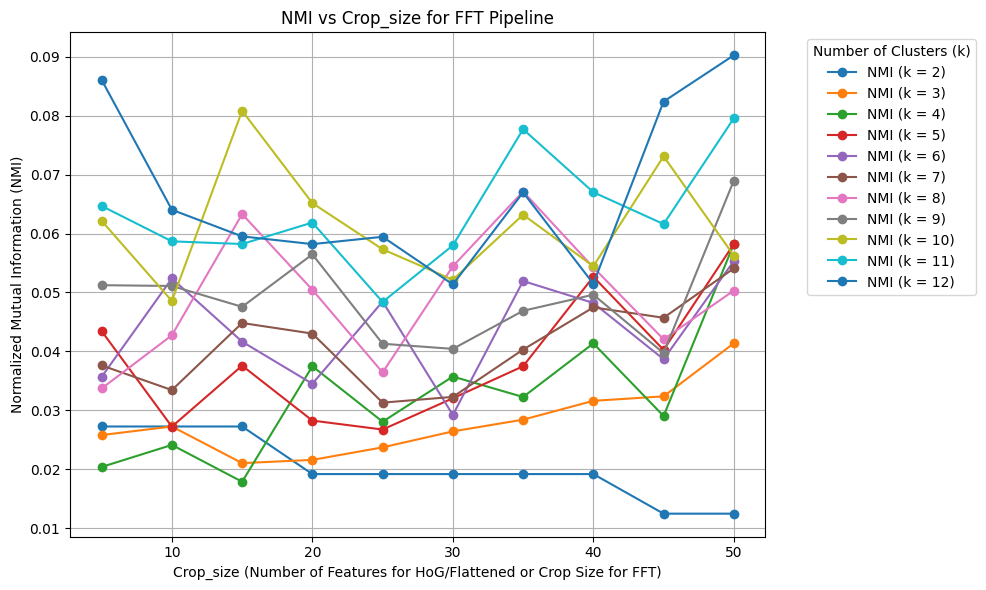

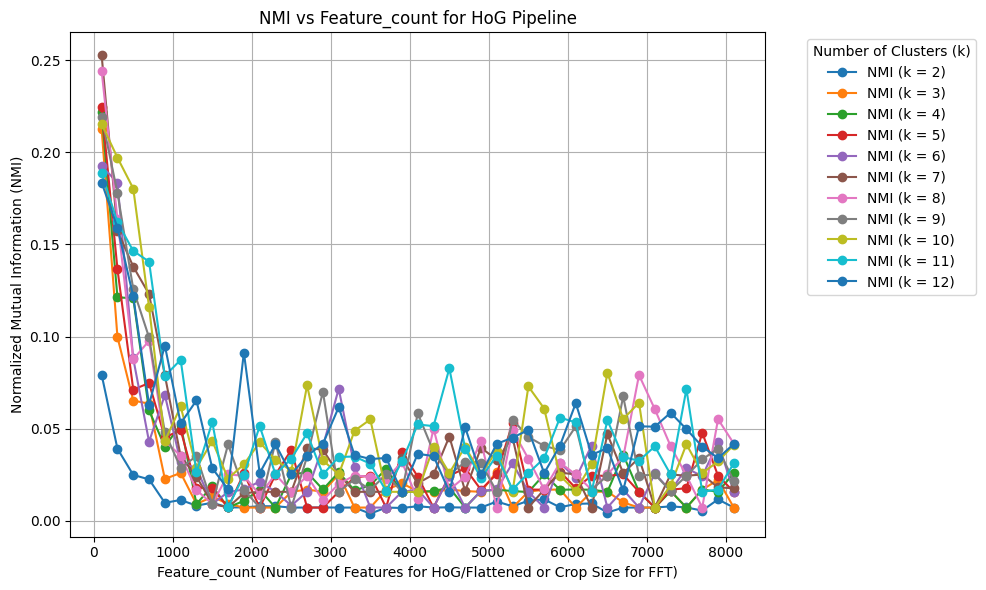

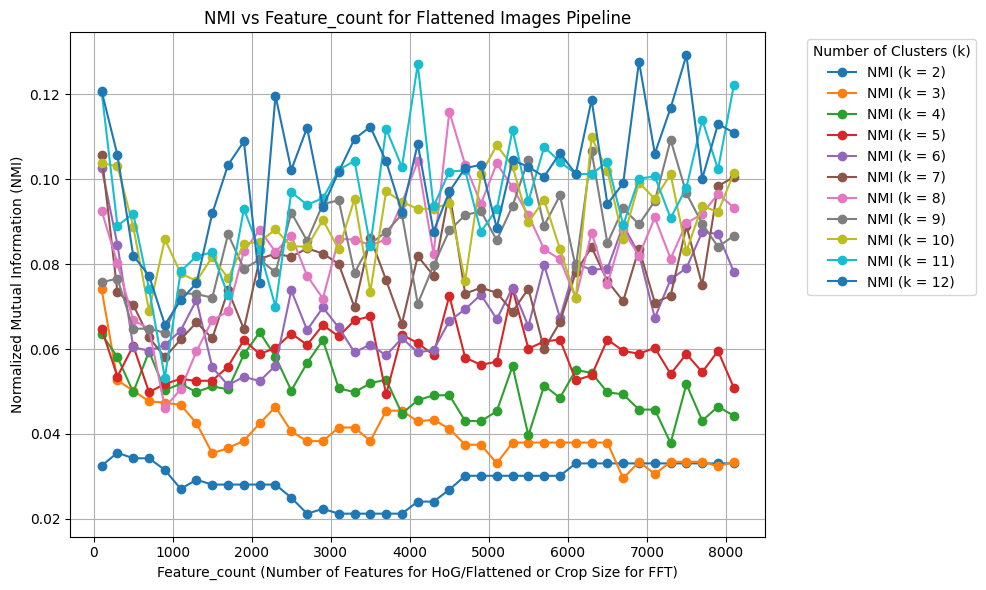

In [14]:
# Visualize Results
plot_nmi_results(results_)
plot_nmi_vs_features_or_crop(results_)

In [15]:
#%% For full image

# Perform Fuzzy C-Means on the FFT features (with 2 clusters)
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    flatten_image_set(images_cleaned).T, 12, m=2, error=0.005, maxiter=1000, init=None)
# Get the cluster membership for each image
cluster_membership = np.argmax(u, axis=0)
# Calculate Normalized Mutual Information
nmi = normalized_mutual_info_score(labels_cleaned, cluster_membership)
print(f"Normalized Mutual Information: {nmi:.4f}")

Normalized Mutual Information: 0.0849


Normalized Mutual Information: 0.2034


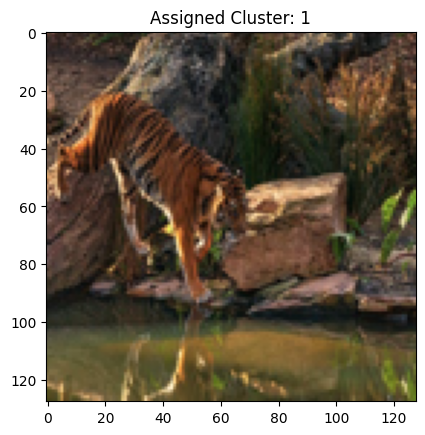

Cluster 0: 1 images
Cluster 1: 28 images
Cluster 2: 4 images
Cluster 3: 0 images
Cluster 4: 22 images
Cluster 5: 42 images
Cluster 6: 0 images
Cluster 7: 9 images
Cluster 8: 43 images
Cluster 9: 7 images
Cluster 10: 0 images
Cluster 11: 0 images


({0: 2, 1: 4, 2: 0, 3: 0, 4: 3, 5: 0, 6: 0, 7: 1, 8: 1, 9: 0, 10: 0, 11: 0},
 array([[ 0,  0,  2,  0,  7, 15,  0,  1,  5,  3,  0,  0],
        [ 0,  4,  0,  0,  1,  5,  0,  3, 14,  0,  0,  0],
        [ 1,  3,  0,  0,  1,  7,  0,  3, 11,  0,  0,  0],
        [ 0,  0,  2,  0, 12,  9,  0,  0,  6,  3,  0,  0],
        [ 0, 21,  0,  0,  1,  6,  0,  2,  7,  1,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]]))

In [16]:
#%% For best nmi result

# Feature Selection
selector = SelectKBest(f_classif, k=300)
selected_hog_features = selector.fit_transform(hog_features, labels_cleaned)
# Perform Fuzzy C-Means on the FFT features (with 2 clusters)
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    selected_hog_features.T, 12, m=2, error=0.005, maxiter=1000, init=None)
# Get the cluster membership for each image
cluster_membership = np.argmax(u, axis=0)
# Calculate Normalized Mutual Information
nmi = normalized_mutual_info_score(labels_cleaned, cluster_membership)
print(f"Normalized Mutual Information: {nmi:.4f}")


# Plot a random image along with its assigned cluster
plot_random_image_with_cluster(images_cleaned, selected_hog_features, cntr, u, cluster_membership)
# Count the number of images in each cluster (for 12 clusters)
count_images_per_cluster(cluster_membership, 12)
# Assign class to cluster
assign_classes_to_clusters(cluster_membership, labels_cleaned, 12, 12)